In [47]:
from imblearn.over_sampling import KMeansSMOTE
import os
import pandas as pd
from glob import glob
from tqdm import tqdm
from tqdm.contrib import tzip
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

WD = 'C:\\Users\Sunwoo\Desktop\업무\code\[코드스테이츠] AIB16\AI_16_허선우_Section2_Project\Data'
os.chdir(WD)

In [48]:
import platform
from matplotlib import font_manager, rc
path = "c:/Windows/Fonts/malgun.ttf"
if platform.system() == 'Darwin':
    rc('font', family='AppleGothic')
elif platform.system() == 'Windows':
    font_name = font_manager.FontProperties(fname=path).get_name()
    rc('font', family=font_name)
else:
    print('Unknown system... sorry~~~~')

In [278]:
y_1 = pd.read_csv('biz_no_2022.csv', index_col = 0).reset_index().drop_duplicates().set_index('사업자등록번호')
X_1 = pd.read_excel('X_2021.xlsx', index_col = 0).drop_duplicates().set_index('사업자등록번호')

X_1 = X_1.loc[pd.merge(X_1, y_1, on = '사업자등록번호', how = 'inner').index].dropna()
y_1 = y_1.loc[X_1.index]['폐업여부']

##
y_2 = pd.read_csv('biz_no_2021.csv', index_col = 0).reset_index().drop_duplicates().set_index('사업자등록번호')
X_2 = pd.read_excel('X_2020.xlsx', index_col = 0).drop_duplicates().set_index('사업자등록번호')

X_2 = X_2.loc[pd.merge(X_2, y_2, on = '사업자등록번호', how = 'inner').index].dropna()
y_2 = y_2.loc[X_2.index]['폐업여부']

##
y_3 = pd.read_csv('biz_no_2020.csv', index_col = 0).reset_index().drop_duplicates().set_index('사업자등록번호')
X_3 = pd.read_excel('X_2019.xlsx', index_col = 0).drop_duplicates().set_index('사업자등록번호')

X_3 = X_3.loc[pd.merge(X_3, y_3, on = '사업자등록번호', how = 'inner').index].dropna()
y_3 = y_3.loc[X_3.index]['폐업여부']

##
y_4 = pd.read_csv('biz_no_2019.csv', index_col = 0).reset_index().drop_duplicates().set_index('사업자등록번호')
X_4 = pd.read_excel('X_2018.xlsx', index_col = 0).drop_duplicates().set_index('사업자등록번호')

X_4 = X_4.loc[pd.merge(X_4, y_4, on = '사업자등록번호', how = 'inner').index].dropna()
y_4 = y_4.loc[X_4.index]['폐업여부']

In [279]:
for i in [y_1, y_2, y_3, y_4]:
    print(i.value_counts())

1    565
0      5
Name: 폐업여부, dtype: int64
1    47133
0      400
Name: 폐업여부, dtype: int64
1    49123
0      287
Name: 폐업여부, dtype: int64
1    43748
0      264
Name: 폐업여부, dtype: int64


In [280]:
for i, year in zip([X_1, X_2, X_3, X_4], [2022, 2021, 2020, 2019]):
    i['예측연도'] = year
X_1

,"('당기순이익', 2021)","('매출액', 2021)","('매출액순이익률', 2021)","('매출액증가율', 2021)","('부채비율', 2021)","('순이익증가율', 2021)","('영업이익', 2021)","('영업이익증가율', 2021)","('자기자본비율', 2021)","('자기자본순이익률', 2021)",...,종합몰,컴퓨터/사무용품,기타_판매품목,TV홈쇼핑,기타_판매방식,신문잡지,인터넷,카탈로그,수도권여부,예측연도
사업자등록번호,,,,,,,,,,,,,,,,,,,,,
101-81-10173,16999,217704,0.078083,0.828124,0.247294,0.127255,11961,-0.106721,0.627393,0.109671,...,0,0,0,0,0,0,1,0,1,2022
101-81-45105,902127,34407840,0.026219,0.072589,0.212095,2.208669,1217200,1.455656,0.616386,0.054924,...,0,0,1,0,0,0,1,0,1,2022
101-81-54642,-1482799,289443,-5.122940,-0.962169,0.399390,-2.828411,-2539670,-3.450371,0.250379,-0.695203,...,0,0,0,0,0,0,1,0,1,2022
101-81-57765,9444519,15567898,0.606666,0.121179,0.065681,1.167607,841774,-8.727022,0.015982,8.928201,...,0,0,0,0,0,0,1,0,1,2022
101-81-59929,28871,1183119,0.024402,0.003290,0.296956,0.152305,30676,0.142921,0.051652,0.288710,...,0,1,0,0,0,0,1,0,1,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
870-81-00994,50566,3242508,0.015595,1.304263,0.624736,2.874789,53676,-6.224450,0.251701,0.337107,...,1,0,0,0,0,0,1,0,1,2022
870-88-01143,-406524,2078279,-0.195606,0.724693,0.426294,-6.139173,-402501,-5.022436,0.793188,-0.320098,...,0,0,0,0,0,0,1,0,1,2022
876-88-00666,116000,1894000,0.061246,0.454685,0.661523,0.757576,134000,0.488889,0.099794,1.195876,...,0,0,0,0,0,0,1,0,1,2022


In [281]:
COLNAME = ['당기순이익', '매출액','매출액순이익율','매출액증가율', '부채비율', '순이익증가율', '영업이익','영업이익증가율','자기자본비율',
           '자기자본순이익률',  '자본금', '자본총계', '총부채', '총부채증가율', '총자본증가율', '총자산', '총자산순이익률', '총자산회전율', '가구/수납용품',
           '가전', '건강/식품', '교육/도서/완구/오락', '레저/여행/공연', '상품권', '성인/성인용품',  '의류/패션/잡화/뷰티', '자동차/자동차용품', '종합몰',
           '컴퓨터/사무용품', '기타_판매품목', 'TV홈쇼핑', '기타_판매방식', '신문잡지', '인터넷', '카탈로그', '수도권여부', '예측연도']

COLNAME2 = ['당기순이익', '매출액','매출액순이익율','매출액증가율', '부채비율', '순이익증가율', '영업이익','영업이익증가율','자기자본비율',
           '자기자본순이익률',  '자본금', '자본총계', '총부채', '총부채증가율', '총자본증가율', '총자산', '총자산순이익률', '총자산회전율', '예측연도']

COLNAME3 = ['당기순이익', '매출액','매출액순이익율','매출액증가율', '부채비율', '순이익증가율', '영업이익','영업이익증가율','자기자본비율',
           '자기자본순이익률',  '자본금', '자본총계', '총부채', '총부채증가율', '총자본증가율', '총자산', '총자산순이익률', '총자산회전율']

In [282]:
lists = []
for i in range(2, 54, 3): lists +=[i]
lists += [72]
    #for i in range(54, 73): lists +=[i]
    
#X_1 = X_1.iloc[:, lists]
#X_2 = X_2.iloc[:, lists]
#X_3 = X_3.iloc[:, lists]
#X_4 = X_4.iloc[:, lists]
    
X_1 = X_1.iloc[:, :18]
X_2 = X_2.iloc[:, :18]
X_3 = X_3.iloc[:, :18]
X_4 = X_4.iloc[:, :18]

In [283]:
for x, Y in zip([X_1, X_2, X_3, X_4], [y_1, y_2, y_3, y_4]):
    x.columns = COLNAME3
    x.reset_index(inplace = True, drop = True)
    Y.reset_index(inplace = True, drop = True)

In [284]:
X = pd.concat([X_1, X_2, X_3, X_4], ignore_index = True)
y = pd.concat([y_1, y_2, y_3, y_4], ignore_index = True)

In [286]:
X_new = X[y == 1].sample(9000, random_state = 42)
X = pd.concat([X_new, X[y == 0]])
y = y.loc[X.index]

In [11]:
y.value_counts()

1    9000
0     956
Name: 폐업여부, dtype: int64

C:\Users\Sunwoo\Anaconda3\lib\site-packages\seaborn\utils.py:95: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
C:\Users\Sunwoo\Anaconda3\lib\site-packages\IPython\core\events.py:89: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  func(*args, **kwargs)
C:\Users\Sunwoo\Anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


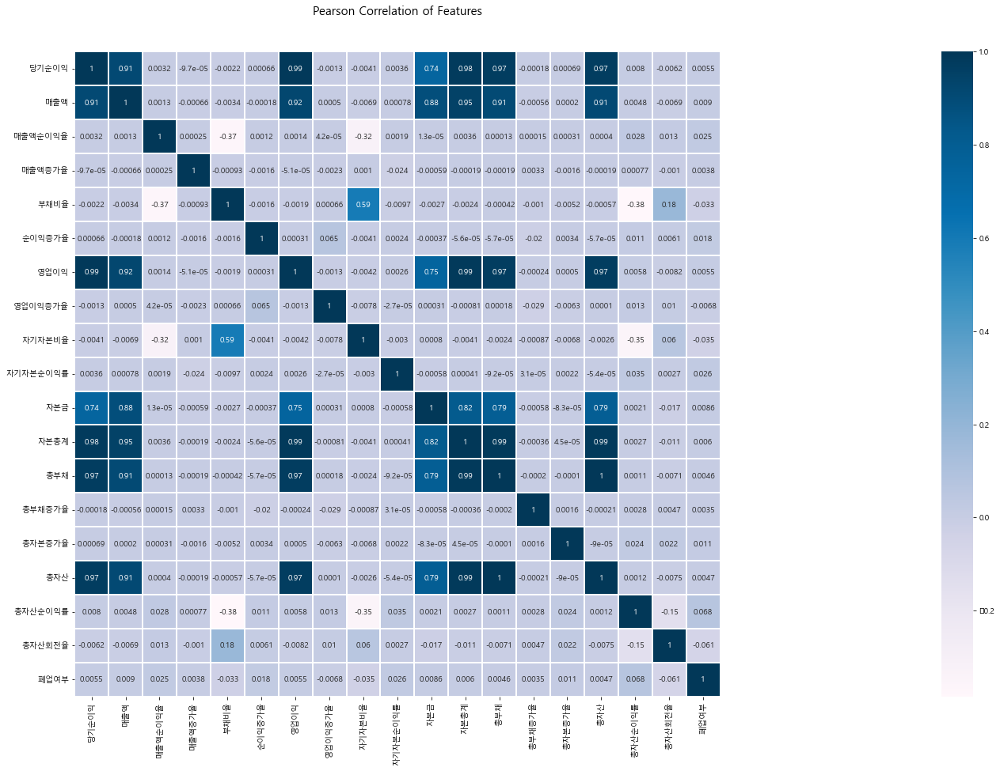

In [12]:
colormap = plt.cm.PuBu
plt.figure(figsize=(100, 15))
plt.title("Pearson Correlation of Features", y = 1.05, size = 15)
sns.heatmap(pd.concat([X, y], axis = 1).corr(method='pearson'), linewidths = 0.1, vmax = 1.0,
           square = True, cmap = colormap, linecolor = "white", annot = True, annot_kws = {"size" : 10});

In [54]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import StandardScaler

seed = 42
imputer = IterativeImputer(max_iter = 10, random_state = seed)
scaler = StandardScaler()

In [55]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, stratify = y, random_state = seed)
print (X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(7964, 18) (1992, 18) (7964,) (1992,)


In [305]:
X_train_2, X_val, y_train_2, y_val = train_test_split(X_train, y_train, test_size = 0.2, stratify = y_train, random_state = seed)
print (X_train_2.shape, X_val.shape, y_train_2.shape, y_val.shape)

(6371, 18) (1593, 18) (6371,) (1593,)


C:\Users\Sunwoo\Anaconda3\lib\site-packages\seaborn\utils.py:95: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()


C:\Users\Sunwoo\Anaconda3\lib\site-packages\IPython\core\events.py:89: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  func(*args, **kwargs)
C:\Users\Sunwoo\Anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


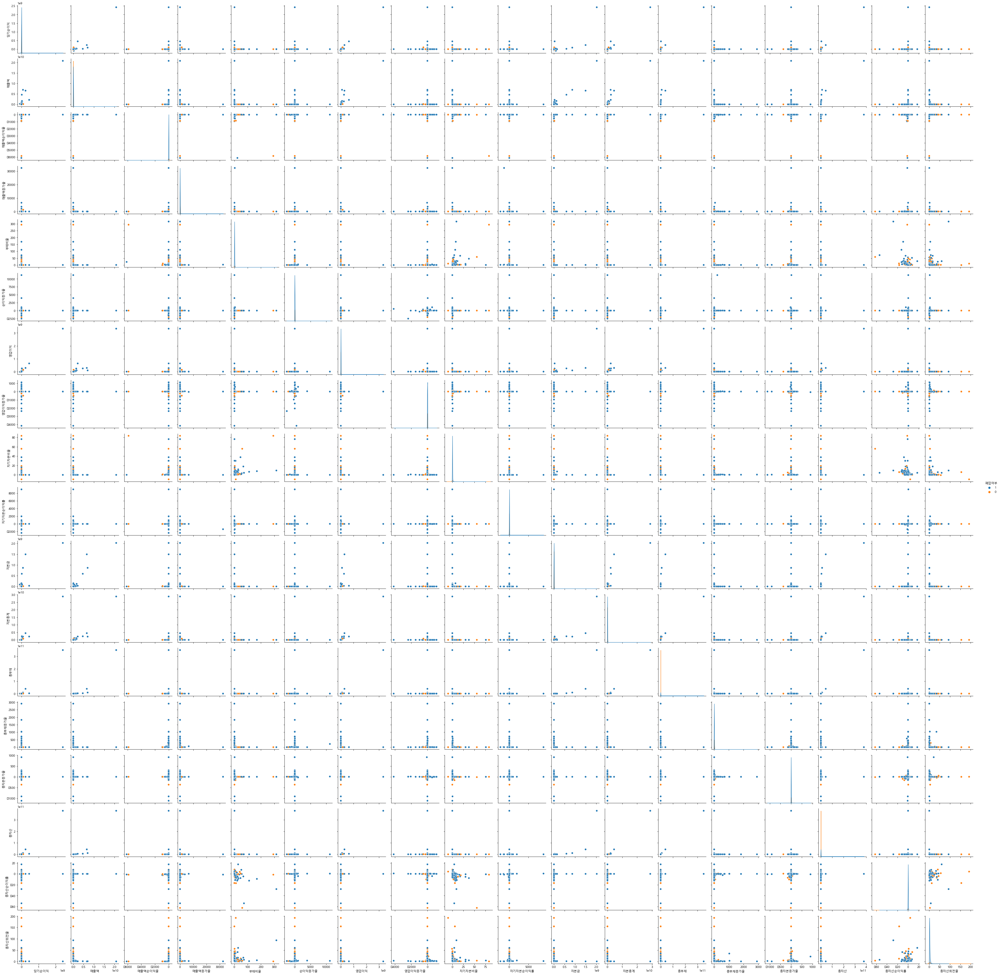

In [57]:
X_train['폐업여부'] = y_train.astype('str')
sns.pairplot(X_train, hue = '폐업여부')

In [79]:
scaler.fit(X_val)

StandardScaler()

In [239]:
X = X_train.iloc[:, :-1]
X = check_array(X, copy=X.copy, ensure_2d=True,
                        accept_sparse="csc", dtype=np.float32,
                        ensure_min_samples=2)
data_IQR = np.quantile(X, 0.75, axis=0) - np.quantile(X, 0.25, axis=0)
data_upper = np.quantile(X, 0.75, axis=0) + data_IQR*1.5
data_lower = np.quantile(X, 0.25, axis=0) - data_IQR*1.5

In [271]:
from sklearn.utils.validation import check_array, check_is_fitted
from scipy import sparse
from sklearn.base import BaseEstimator, TransformerMixin
import numpy as np

class drop_outlier(BaseEstimator, TransformerMixin):
    
    def __init__(self, copy = True, with_IQR = True, with_upper = True, with_lower = True):
        self.with_IQR = with_IQR
        self.with_upper = with_upper
        self.with_lower = with_lower
        self.copy = copy
        
    def fit(self, X, y=None):
                  
        data_IQR = np.quantile(X, 0.75, axis=0) - np.quantile(X, 0.25, axis=0)
        data_upper = np.quantile(X, 0.75, axis=0) + data_IQR*1.5
        data_lower = np.quantile(X, 0.25, axis=0) - data_IQR*1.5
        
        self.upper_ = data_upper
        self.lower_ = data_lower
        
        return self
        
    def transform(self, X, y=None, copy=None):
        
        copy = copy if copy is not None else self.copy
        
        self.upper_ = data_upper
        self.lower_ = data_lower
        
        if self.with_lower:
            X = X[X > self.lower_]
            
        if self.with_upper:
            X = X[X < self.upper_]
            
        return X

In [244]:
X_train.iloc[:, :-1]

,당기순이익,매출액,매출액순이익율,매출액증가율,부채비율,순이익증가율,영업이익,영업이익증가율,자기자본비율,자기자본순이익률,자본금,자본총계,총부채,총부채증가율,총자본증가율,총자산,총자산순이익률,총자산회전율
93947,2268,1323127.0,0.001714,0.108610,0.804028,-0.691932,616,-0.838617,0.003847,2.268000,1000,50944.0,209011,-0.234947,0.068546,259955.0,0.008725,5.089831
5316,81522,2789962.0,0.029220,0.179112,0.331564,-0.241959,-75659,-2.943063,0.066868,1.630440,50000,499818.0,247924,2.441334,0.194891,747742.0,0.109024,3.731183
130604,212456,8140221.0,0.026100,39.858205,0.113945,29.333524,212456,29.333524,0.164413,4.249120,50000,269460.0,34652,33.756269,3.727037,304112.0,0.698611,26.767181
36463,-77874,126138.0,-0.617371,-0.010907,0.892337,-3.822749,-59249,-2.168573,0.884817,-0.195026,399300,48586.0,402694,0.098222,-0.615799,451280.0,-0.172562,0.279512
23831,10011,71822.0,0.139386,-0.382988,8.713109,-2.364268,14087,-4.883926,0.246759,0.333700,30000,-937729.0,1059305,-0.014349,-0.010563,121576.0,0.082344,0.590758
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64565,103503,3558153.0,0.029089,0.484596,0.654406,-0.437410,136550,-0.369953,0.008340,10.350300,10000,414370.0,784637,0.165281,0.332954,1199007.0,0.086324,2.967583
51512,165744,11876435.0,0.013956,-0.194771,0.365894,-0.819100,74365,-0.918452,0.032810,1.381200,120000,2319169.0,1338214,-0.083446,0.076968,3657383.0,0.045318,3.247249
28812,11001364,217417353.0,0.050600,-0.019968,0.266700,-0.445443,10065205,-0.088911,0.045481,1.208941,9100000,146721101.0,53362253,-0.103967,0.066754,200083354.0,0.054984,1.086634
104198,-287938,29032.0,-9.917953,-0.812624,3.575956,1.855423,-281803,1.722024,0.414243,-5.758760,50000,-310923.0,431625,0.341800,12.527213,120702.0,-2.385528,0.240526


C:\Users\Sunwoo\Anaconda3\lib\site-packages\seaborn\utils.py:95: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()


C:\Users\Sunwoo\Anaconda3\lib\site-packages\IPython\core\events.py:89: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  func(*args, **kwargs)
C:\Users\Sunwoo\Anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


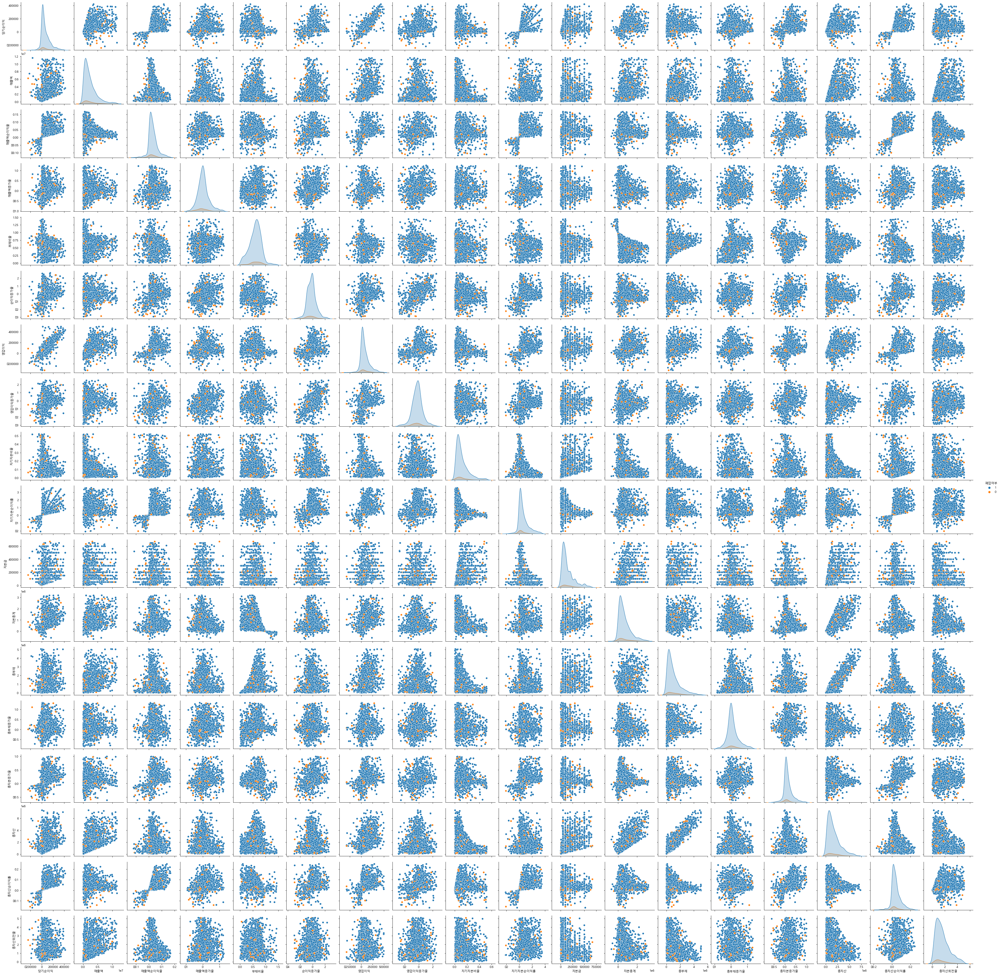

In [41]:
drop_outlier().fit(X_train.iloc[:, :-1])
X_train_new = drop_outlier().transform(X_train.iloc[:, :-1])

X_train_new['폐업여부'] = y_train.astype('str')
sns.pairplot(X_train_new.dropna(), hue = '폐업여부')

C:\Users\Sunwoo\Anaconda3\lib\site-packages\seaborn\utils.py:95: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
C:\Users\Sunwoo\Anaconda3\lib\site-packages\IPython\core\events.py:89: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  func(*args, **kwargs)
C:\Users\Sunwoo\Anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


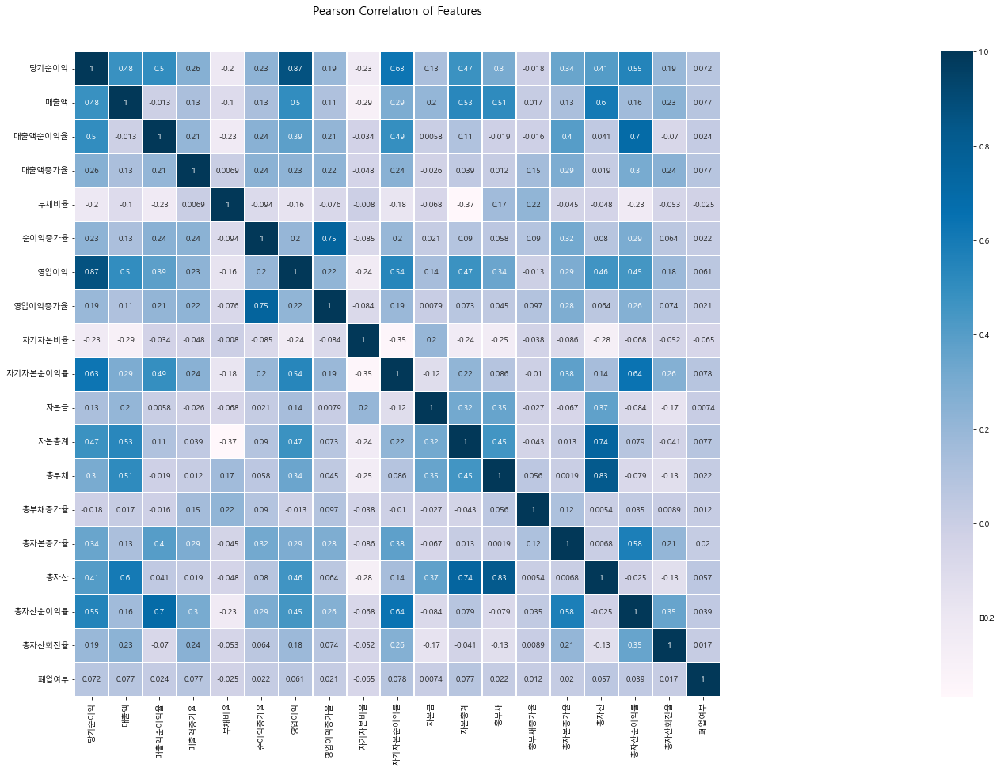

In [287]:
colormap = plt.cm.PuBu
plt.figure(figsize=(100, 15))
plt.title("Pearson Correlation of Features", y = 1.05, size = 15)
sns.heatmap(pd.concat([X_train_new, y], axis = 1).corr(method='pearson'), linewidths = 0.1, vmax = 1.0,
           square = True, cmap = colormap, linecolor = "white", annot = True, annot_kws = {"size" : 10});

In [262]:
# 모델 학습
from xgboost import XGBClassifier
from sklearn.metrics import f1_score, average_precision_score
import eli5
from eli5.sklearn import PermutationImportance 
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import make_scorer, accuracy_score, recall_score, precision_score, roc_auc_score
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline

In [263]:
#Voting Classifier
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier
from sklearn.ensemble import VotingClassifier, RandomForestClassifier, AdaBoostClassifier, StackingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
from sklearn.neural_network import MLPClassifier

scale_pos_weight = y_test.value_counts()[0] / y_test.value_counts()[1]

SVC = SVC(probability=True, random_state = 42, kernel = 'sigmoid')
LGBM = LGBMClassifier(n_jobs=-1, random_state = 42, n_estimators= 500)
RF = RandomForestClassifier(n_jobs=-1,random_state = 42, n_estimators= 500)
LR = LogisticRegression(random_state = 42)
XGB = XGBClassifier(n_jobs=-1, random_state = 42, n_estimators= 500, scale_pos_weight= scale_pos_weight)
MLP = MLPClassifier(alpha=1e-5, hidden_layer_sizes=(32, 128, 64), random_state = 42)

eclf = StackingClassifier(
       estimators=[('LGBM', LGBM),('RF', RF), ('LR', LR), ('XGB', XGB), ('MLP', MLP), ('SVC', SVC)],
       final_estimator = XGB)

In [290]:
pipe = Pipeline([
    ('preprocessing', make_pipeline(drop_outlier())),
    ('model', LGBM)
])

pipe.fit(X_train_2, y_train_2)

perm = PermutationImportance(pipe.named_steps['model'], scoring='average_precision', n_iter=1000, random_state =seed)
X_val_trans = pipe.named_steps['preprocessing'].transform(X_val)
Feature_Importance = perm.fit(X_val_trans, y_val)

eli5.show_weights(Feature_Importance, top=None, feature_names= X_train.columns[:18].tolist())

Weight,Feature
0.0045 ± 0.0046,총자산
0.0045 ± 0.0052,영업이익증가율
0.0032 ± 0.0047,매출액
0.0022 ± 0.0045,부채비율
0.0016 ± 0.0059,자기자본순이익률
0.0015 ± 0.0036,총부채
0.0015 ± 0.0050,매출액증가율
0.0013 ± 0.0033,자본총계
0.0013 ± 0.0040,총자본증가율
0.0004 ± 0.0037,영업이익


In [306]:
minimum_importance = 0.001
mask = perm.feature_importances_ > minimum_importance

X_train = X_train.iloc[:,:18]

features = X_train.columns[mask]
X_train_selected = X_train[features]
X_train_2_selected = X_train_2[features]
X_val_selected = X_val[features]
X_test_selected = X_test[features]

X_train_selected

,매출액,매출액증가율,부채비율,영업이익증가율,자기자본순이익률,자본총계,총부채,총자본증가율,총자산
93947,1323127.0,0.108610,0.804028,-0.838617,2.268000,50944.0,209011,0.068546,259955.0
5316,2789962.0,0.179112,0.331564,-2.943063,1.630440,499818.0,247924,0.194891,747742.0
130604,8140221.0,39.858205,0.113945,29.333524,4.249120,269460.0,34652,3.727037,304112.0
36463,126138.0,-0.010907,0.892337,-2.168573,-0.195026,48586.0,402694,-0.615799,451280.0
23831,71822.0,-0.382988,8.713109,-4.883926,0.333700,-937729.0,1059305,-0.010563,121576.0
...,...,...,...,...,...,...,...,...,...
64565,3558153.0,0.484596,0.654406,-0.369953,10.350300,414370.0,784637,0.332954,1199007.0
51512,11876435.0,-0.194771,0.365894,-0.918452,1.381200,2319169.0,1338214,0.076968,3657383.0
28812,217417353.0,-0.019968,0.266700,-0.088911,1.208941,146721101.0,53362253,0.066754,200083354.0
104198,29032.0,-0.812624,3.575956,1.722024,-5.758760,-310923.0,431625,12.527213,120702.0


In [307]:
def print_score(y_test, y_pred, y_pred_proba):
    print('ACC:', accuracy_score(y_test, y_pred))
    print('REC:', recall_score(y_test, y_pred))
    print('PRE:', precision_score(y_test, y_pred))·
    print('F1:', f1_score(y_test, y_pred))
    print('AP:', average_precision_score(y_test, y_pred_proba))
    print('ROC_AUC:', roc_auc_score(y_test, y_pred_proba))
    
def make_score(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train);
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:,1]
    print_score(y_test, y_pred, y_pred_proba)
    return model

SyntaxError: invalid character '·' (U+00B7) (968316512.py, line 4)

In [308]:
lists = []
for i in range(len(y_val)): lists += [1]

print_score(y_val, np.array(lists), np.array(lists))

ACC: 0.903954802259887
REC: 1.0
PRE: 0.903954802259887
F1: 0.9495548961424332
AP: 0.903954802259887
ROC_AUC: 0.5


In [309]:
LGBM = make_score(LGBM, X_train_2_selected, y_train_2, X_val_selected, y_val)

ACC: 0.8983050847457628
REC: 0.9909722222222223
PRE: 0.9054568527918782
F1: 0.9462864721485411
AP: 0.9315477913977901
ROC_AUC: 0.5940677196804648


In [310]:
RF = make_score(RF, X_train_2_selected, y_train_2, X_val_selected, y_val)

ACC: 0.9020715630885122
REC: 0.9958333333333333
PRE: 0.9053030303030303
F1: 0.9484126984126984
AP: 0.926232929278939
ROC_AUC: 0.6112155047204068


In [311]:
XGB = make_score(XGB, X_train_2_selected, y_train_2, X_val_selected, y_val)

ACC: 0.8618957940991839
REC: 0.9375
PRE: 0.9121621621621622
F1: 0.9246575342465754
AP: 0.9270151462920078
ROC_AUC: 0.5718432280319534


In [312]:
MLP = make_score(MLP, X_train_2_selected, y_train_2, X_val_selected, y_val)

ACC: 0.903954802259887
REC: 1.0
PRE: 0.903954802259887
F1: 0.9495548961424332
AP: 0.903954802259887
ROC_AUC: 0.5


In [313]:
LR = make_score(LR, X_train_2_selected, y_train_2, X_val_selected, y_val)

ACC: 0.8920276208411801
REC: 0.9868055555555556
PRE: 0.9027954256670903
F1: 0.9429329794293297
AP: 0.915199940598512
ROC_AUC: 0.5511528685548293


In [314]:
SVC = make_score(SVC, X_train_2_selected, y_train_2, X_val_selected, y_val)

ACC: 0.903954802259887
REC: 1.0
PRE: 0.903954802259887
F1: 0.9495548961424332
AP: 0.9149778421894976
ROC_AUC: 0.5607933914306463


In [315]:
eclf = StackingClassifier(
       estimators=[('LGBM', LGBM),('RF', RF), ('LR', LR), ('XGB', XGB), ('MLP', MLP), ('SVC', SVC)],
       final_estimator = XGB)

eclf = make_score(eclf, X_train_2_selected, y_train_2, X_val_selected, y_val)

ACC: 0.8537350910232266
REC: 0.9291666666666667
PRE: 0.9108236895847516
F1: 0.9199037469920934
AP: 0.9168818055981128
ROC_AUC: 0.5528186274509803


In [316]:
from hyperopt import fmin, tpe, Trials, STATUS_OK
from hyperopt import hp
from sklearn.model_selection import cross_val_score
import numpy as np

In [320]:
#RF

RF_params = {
    "randomforestclassifier__max_depth": hp.quniform("max_depth", 2, 20, 1),
    "randomforestclassifier__max_features": hp.uniform("max_features", 0.5, 1.0),}

def RF_pipe(params):
    params["randomforestclassifier__max_depth"] = int(
        params["randomforestclassifier__max_depth"]
    )  # max_depth는 정수형으로 변환해 줍니다.
    pipe = make_pipeline(drop_outlier(), scaler, imputer, RF).set_params(**params)
    return pipe

def RF_fit_and_eval(params):
    score = cross_val_score(RF_pipe(params), X_train, y_train, cv=3, scoring="average_precision")
    avg_cv_score = np.mean(score)
    # roc_auc는 클수록 좋은 metric이므로, hyperopt.fmin이 roc_auc를 최대화하도록 하기 위해 -부호를 붙여 반환합니다.
    return {"loss": -avg_cv_score, "status": STATUS_OK}




##XGB

XGB_params = {
    "xgbclassifier__max_depth": hp.quniform("max_depth", 2, 20, 1),
    "xgbclassifier__gamma": hp.uniform("gamma", 0, 1.0),
    "xgbclassifier__learning_rate": hp.uniform("learning_rate", 0.05, 1.0),}

def XGB_pipe(params):
    params["xgbclassifier__max_depth"] = int(params["xgbclassifier__max_depth"])  # max_depth는 정수형으로 변환해 줍니다.
    pipe = make_pipeline(drop_outlier(), scaler, imputer, XGB).set_params(**params)
    return pipe

def XGB_fit_and_eval(params):
    score = cross_val_score(XGB_pipe(params), X_train, y_train, cv=3, scoring="average_precision")
    avg_cv_score = np.mean(score)
    # roc_auc는 클수록 좋은 metric이므로, hyperopt.fmin이 roc_auc를 최대화하도록 하기 위해 -부호를 붙여 반환합니다.
    return {"loss": -avg_cv_score, "status": STATUS_OK}




## LGBM

LGBM_params = {
    "lgbmclassifier__max_depth": hp.quniform("max_depth", 2, 20, 1),
    "lgbmclassifier__num_leaves": hp.quniform("num_leaves", 20, 50, 1),
    "lgbmclassifier__learning_rate": hp.uniform("learning_rate", 0.05, 1.0),}

def LGBM_pipe(params):
    params["lgbmclassifier__max_depth"] = int(params["lgbmclassifier__max_depth"])  # max_depth는 정수형으로 변환해 줍니다.
    params["lgbmclassifier__num_leaves"] = int(params["lgbmclassifier__num_leaves"])  # max_depth는 정수형으로 변환해 줍니다.
    pipe = make_pipeline(drop_outlier(), scaler, imputer, LGBM).set_params(**params)
    return pipe

def LGBM_fit_and_eval(params):
    score = cross_val_score(LGBM_pipe(params), X_train, y_train, cv=3, scoring="average_precision")
    avg_cv_score = np.mean(score)
    # roc_auc는 클수록 좋은 metric이므로, hyperopt.fmin이 roc_auc를 최대화하도록 하기 위해 -부호를 붙여 반환합니다.
    return {"loss": -avg_cv_score, "status": STATUS_OK}




## SVC

SVC_params = {
    "svc__kernel": hp.choice("kernel", ["linear", "rbf", "sigmoid"]),
    "svc__gamma": hp.uniform("gamma", 0.05, 1),
    "svc__C": hp.uniform("C", 0.05, 1),}

def SVC_pipe(params):
    pipe = make_pipeline(drop_outlier(), scaler, imputer, SVC).set_params(**params)
    return pipe

def SVC_fit_and_eval(params):
    score = cross_val_score(SVC_pipe(params), X_train, y_train, cv=3, scoring="average_precision")
    avg_cv_score = np.mean(score)
    # roc_auc는 클수록 좋은 metric이므로, hyperopt.fmin이 roc_auc를 최대화하도록 하기 위해 -부호를 붙여 반환합니다.
    return {"loss": -avg_cv_score, "status": STATUS_OK}




## MLP

MLP_params = {
    "mlpclassifier__activation": hp.choice("activation", ["logistic", "relu", "tanh"]),
    "mlpclassifier__alpha": hp.uniform("alpha",0.05, 1),
    "mlpclassifier__batch_size": hp.choice("batch_size", [ 64, 128, 256, 512]),}

def MLP_pipe(params):
    pipe = make_pipeline(drop_outlier(), scaler, imputer, MLP).set_params(**params)
    return pipe

def MLP_fit_and_eval(params):
    score = cross_val_score(MLP_pipe(params), X_train, y_train, cv=3, scoring="average_precision")
    avg_cv_score = np.mean(score)
    # roc_auc는 클수록 좋은 metric이므로, hyperopt.fmin이 roc_auc를 최대화하도록 하기 위해 -부호를 붙여 반환합니다.
    return {"loss": -avg_cv_score, "status": STATUS_OK}






## LR

LR_params = {
    "logisticregression__penalty": hp.choice("penalty", ["l1", "l2"]),
    "logisticregression__C": hp.uniform("C", 0.05, 1),
    "logisticregression__solver": hp.choice("solver", ["saga", "liblinear"]),}

def LR_pipe(params):
    pipe = make_pipeline(drop_outlier(), scaler, imputer, LR).set_params(**params)
    return pipe

def LR_fit_and_eval(params):
    score = cross_val_score(LR_pipe(params), X_train, y_train, cv=3, scoring="average_precision")
    avg_cv_score = np.mean(score)
    # 클수록 좋은 metric이므로, hyperopt.fmin이 최대화하도록 하기 위해 -부호를 붙여 반환
    return {"loss": -avg_cv_score, "status": STATUS_OK}

In [321]:
#RF
trials = (Trials())  # Trials() 객체를 fmin에 함께 넣어 실행하면, 실행되는 매 fit의 학습 정보 및 학습 결과가 해당 객체에 모두 저장됩니다.
RF_best_params = fmin(fn=RF_fit_and_eval, trials=trials, space=RF_params, algo=tpe.suggest, max_evals=100)  # max_evals 횟수만큼 하이퍼파라미터 조합을 탐색합니다.

print("최적 하이퍼파라미터: ", trials.best_trial["misc"]["vals"])
print("최적 AP: ", -trials.best_trial["result"]["loss"])

  0%|          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  1%|          | 1/100 [00:11<18:59, 11.51s/trial, best loss: -0.932230395068371]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  2%|▏         | 2/100 [00:21<17:43, 10.85s/trial, best loss: -0.9330621768737939]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  3%|▎         | 3/100 [00:29<15:01,  9.29s/trial, best loss: -0.9343646968092273]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  4%|▍         | 4/100 [00:38<14:51,  9.29s/trial, best loss: -0.9343646968092273]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  5%|▌         | 5/100 [00:42<11:21,  7.17s/trial, best loss: -0.9343646968092273]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  6%|▌         | 6/100 [00:50<11:59,  7.65s/trial, best loss: -0.9343646968092273]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  7%|▋         | 7/100 [01:00<13:03,  8.42s/trial, best loss: -0.9343646968092273]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  8%|▊         | 8/100 [01:07<12:18,  8.02s/trial, best loss: -0.9343646968092273]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  9%|▉         | 9/100 [01:14<11:32,  7.60s/trial, best loss: -0.9343646968092273]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 10%|█         | 10/100 [01:19<10:07,  6.74s/trial, best loss: -0.9343646968092273]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 11%|█         | 11/100 [01:30<11:50,  7.99s/trial, best loss: -0.9343646968092273]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 12%|█▏        | 12/100 [01:33<09:35,  6.54s/trial, best loss: -0.9343646968092273]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 13%|█▎        | 13/100 [01:39<09:20,  6.44s/trial, best loss: -0.9343646968092273]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 14%|█▍        | 14/100 [01:46<09:26,  6.58s/trial, best loss: -0.9343646968092273]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 15%|█▌        | 15/100 [01:50<08:03,  5.69s/trial, best loss: -0.9343646968092273]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 16%|█▌        | 16/100 [02:00<10:07,  7.24s/trial, best loss: -0.9343646968092273]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 17%|█▋        | 17/100 [02:10<10:47,  7.80s/trial, best loss: -0.9343646968092273]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 18%|█▊        | 18/100 [02:19<11:31,  8.43s/trial, best loss: -0.9343646968092273]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 19%|█▉        | 19/100 [02:28<11:23,  8.44s/trial, best loss: -0.936266063085411] 

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 20%|██        | 20/100 [02:35<10:42,  8.03s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 21%|██        | 21/100 [02:44<10:52,  8.26s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 22%|██▏       | 22/100 [02:51<10:26,  8.03s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 23%|██▎       | 23/100 [02:56<08:55,  6.96s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 24%|██▍       | 24/100 [03:05<09:30,  7.51s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 25%|██▌       | 25/100 [03:12<09:29,  7.59s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 26%|██▌       | 26/100 [03:20<09:18,  7.55s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 27%|██▋       | 27/100 [03:27<08:57,  7.36s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 28%|██▊       | 28/100 [03:36<09:32,  7.96s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 29%|██▉       | 29/100 [03:40<08:09,  6.90s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 30%|███       | 30/100 [03:48<08:07,  6.97s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 31%|███       | 31/100 [03:57<08:45,  7.61s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 32%|███▏      | 32/100 [04:04<08:37,  7.61s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 33%|███▎      | 33/100 [04:12<08:33,  7.66s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 34%|███▍      | 34/100 [04:19<08:15,  7.51s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 35%|███▌      | 35/100 [04:28<08:23,  7.75s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 36%|███▌      | 36/100 [04:34<07:58,  7.48s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 37%|███▋      | 37/100 [04:42<08:01,  7.64s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 38%|███▊      | 38/100 [04:50<08:00,  7.74s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 39%|███▉      | 39/100 [04:57<07:23,  7.27s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 40%|████      | 40/100 [05:04<07:22,  7.38s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 41%|████      | 41/100 [05:10<06:52,  6.99s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 42%|████▏     | 42/100 [05:15<06:00,  6.22s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 43%|████▎     | 43/100 [05:22<06:15,  6.58s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 44%|████▍     | 44/100 [05:28<05:55,  6.34s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 45%|████▌     | 45/100 [05:34<05:50,  6.37s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 46%|████▌     | 46/100 [05:44<06:36,  7.34s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 47%|████▋     | 47/100 [05:53<06:55,  7.84s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 48%|████▊     | 48/100 [05:56<05:36,  6.47s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 49%|████▉     | 49/100 [06:05<06:10,  7.26s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 50%|█████     | 50/100 [06:13<06:07,  7.36s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 51%|█████     | 51/100 [06:21<06:07,  7.50s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 52%|█████▏    | 52/100 [06:27<05:37,  7.02s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 53%|█████▎    | 53/100 [06:30<04:43,  6.04s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 54%|█████▍    | 54/100 [06:36<04:33,  5.95s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 55%|█████▌    | 55/100 [06:45<05:06,  6.80s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 56%|█████▌    | 56/100 [06:52<05:04,  6.92s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 57%|█████▋    | 57/100 [07:01<05:23,  7.51s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 58%|█████▊    | 58/100 [07:10<05:31,  7.89s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 59%|█████▉    | 59/100 [07:17<05:15,  7.69s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 60%|██████    | 60/100 [07:25<05:09,  7.74s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 61%|██████    | 61/100 [07:35<05:27,  8.41s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 62%|██████▏   | 62/100 [07:43<05:11,  8.20s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 63%|██████▎   | 63/100 [07:49<04:39,  7.55s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 64%|██████▍   | 64/100 [07:57<04:36,  7.68s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 65%|██████▌   | 65/100 [08:05<04:31,  7.76s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 66%|██████▌   | 66/100 [08:13<04:36,  8.13s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 67%|██████▋   | 67/100 [08:23<04:37,  8.41s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 68%|██████▊   | 68/100 [08:31<04:30,  8.46s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 69%|██████▉   | 69/100 [08:38<04:11,  8.11s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 70%|███████   | 70/100 [08:46<04:01,  8.06s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 71%|███████   | 71/100 [08:54<03:47,  7.84s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 72%|███████▏  | 72/100 [09:01<03:34,  7.64s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 73%|███████▎  | 73/100 [09:08<03:21,  7.46s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 74%|███████▍  | 74/100 [09:15<03:12,  7.39s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 75%|███████▌  | 75/100 [09:23<03:08,  7.54s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 76%|███████▌  | 76/100 [09:31<03:05,  7.75s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 77%|███████▋  | 77/100 [09:37<02:46,  7.24s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 78%|███████▊  | 78/100 [09:44<02:38,  7.18s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 79%|███████▉  | 79/100 [09:52<02:32,  7.26s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 80%|████████  | 80/100 [09:59<02:25,  7.27s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 81%|████████  | 81/100 [10:08<02:27,  7.75s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 82%|████████▏ | 82/100 [10:15<02:16,  7.60s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 83%|████████▎ | 83/100 [10:23<02:11,  7.75s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 84%|████████▍ | 84/100 [10:28<01:49,  6.83s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 85%|████████▌ | 85/100 [10:36<01:47,  7.14s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 86%|████████▌ | 86/100 [10:45<01:47,  7.71s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 87%|████████▋ | 87/100 [10:49<01:24,  6.52s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 88%|████████▊ | 88/100 [10:56<01:22,  6.90s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 89%|████████▉ | 89/100 [11:01<01:09,  6.29s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 90%|█████████ | 90/100 [11:09<01:07,  6.79s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 91%|█████████ | 91/100 [11:15<00:57,  6.40s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 92%|█████████▏| 92/100 [11:23<00:55,  6.96s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 93%|█████████▎| 93/100 [11:29<00:47,  6.81s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 94%|█████████▍| 94/100 [11:38<00:43,  7.28s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 95%|█████████▌| 95/100 [11:46<00:37,  7.53s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 96%|█████████▌| 96/100 [11:54<00:30,  7.73s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 97%|█████████▋| 97/100 [12:02<00:23,  7.70s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 98%|█████████▊| 98/100 [12:10<00:15,  7.72s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 99%|█████████▉| 99/100 [12:17<00:07,  7.62s/trial, best loss: -0.936266063085411]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



100%|██████████| 100/100 [12:21<00:00,  7.41s/trial, best loss: -0.936266063085411]
최적 하이퍼파라미터:  {'max_depth': [20.0], 'max_features': [0.6519586311408159]}
최적 AP:  0.936266063085411


In [322]:
#XGB
trials = (Trials())  # Trials() 객체를 fmin에 함께 넣어 실행하면, 실행되는 매 fit의 학습 정보 및 학습 결과가 해당 객체에 모두 저장됩니다.
XGB_best_params = fmin(fn=XGB_fit_and_eval, trials=trials, space=XGB_params, algo=tpe.suggest, max_evals=100)  # max_evals 횟수만큼 하이퍼파라미터 조합을 탐색합니다.

print("최적 하이퍼파라미터: ", trials.best_trial["misc"]["vals"])
print("최적 AP: ", -trials.best_trial["result"]["loss"])

  0%|          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  1%|          | 1/100 [00:06<10:11,  6.17s/trial, best loss: -0.9252061915818666]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  2%|▏         | 2/100 [00:15<12:50,  7.86s/trial, best loss: -0.9252061915818666]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  3%|▎         | 3/100 [00:24<13:33,  8.38s/trial, best loss: -0.9252061915818666]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  4%|▍         | 4/100 [00:28<11:01,  6.89s/trial, best loss: -0.9252061915818666]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  5%|▌         | 5/100 [00:35<10:37,  6.71s/trial, best loss: -0.9280884815821572]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  6%|▌         | 6/100 [00:44<11:42,  7.47s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  7%|▋         | 7/100 [00:50<11:06,  7.17s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  8%|▊         | 8/100 [00:56<10:15,  6.69s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  9%|▉         | 9/100 [01:02<09:59,  6.59s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 10%|█         | 10/100 [01:12<11:27,  7.64s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 11%|█         | 11/100 [01:17<10:08,  6.84s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 12%|█▏        | 12/100 [01:22<09:19,  6.35s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 13%|█▎        | 13/100 [01:31<10:04,  6.95s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 14%|█▍        | 14/100 [01:35<08:54,  6.21s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 15%|█▌        | 15/100 [01:46<10:50,  7.66s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 16%|█▌        | 16/100 [01:54<10:37,  7.59s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 17%|█▋        | 17/100 [01:58<09:10,  6.63s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 18%|█▊        | 18/100 [02:05<09:03,  6.62s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 19%|█▉        | 19/100 [02:10<08:14,  6.11s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 20%|██        | 20/100 [02:17<08:46,  6.58s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 21%|██        | 21/100 [02:27<09:52,  7.50s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 22%|██▏       | 22/100 [02:35<09:57,  7.66s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 23%|██▎       | 23/100 [02:45<10:51,  8.46s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 24%|██▍       | 24/100 [02:53<10:31,  8.31s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 25%|██▌       | 25/100 [03:03<10:52,  8.70s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 26%|██▌       | 26/100 [03:06<08:42,  7.05s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 27%|██▋       | 27/100 [03:15<09:11,  7.55s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 28%|██▊       | 28/100 [03:22<09:03,  7.55s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 29%|██▉       | 29/100 [03:32<09:30,  8.03s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 30%|███       | 30/100 [03:38<08:58,  7.69s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 31%|███       | 31/100 [03:42<07:18,  6.35s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 32%|███▏      | 32/100 [03:51<08:09,  7.20s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 33%|███▎      | 33/100 [03:59<08:11,  7.34s/trial, best loss: -0.9306500968092536]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 34%|███▍      | 34/100 [04:09<09:13,  8.39s/trial, best loss: -0.9310533386754262]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 35%|███▌      | 35/100 [04:20<09:49,  9.07s/trial, best loss: -0.9310533386754262]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 36%|███▌      | 36/100 [04:32<10:27,  9.80s/trial, best loss: -0.9310533386754262]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 37%|███▋      | 37/100 [04:42<10:33, 10.06s/trial, best loss: -0.9310533386754262]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 38%|███▊      | 38/100 [04:51<09:57,  9.63s/trial, best loss: -0.9310533386754262]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 39%|███▉      | 39/100 [05:01<09:53,  9.74s/trial, best loss: -0.9310533386754262]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 40%|████      | 40/100 [05:10<09:39,  9.66s/trial, best loss: -0.9310533386754262]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 41%|████      | 41/100 [05:21<09:53, 10.06s/trial, best loss: -0.9310533386754262]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 42%|████▏     | 42/100 [05:32<10:00, 10.35s/trial, best loss: -0.9310533386754262]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 43%|████▎     | 43/100 [05:41<09:14,  9.74s/trial, best loss: -0.9310533386754262]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 44%|████▍     | 44/100 [05:50<08:51,  9.50s/trial, best loss: -0.9310533386754262]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 45%|████▌     | 45/100 [05:55<07:41,  8.39s/trial, best loss: -0.9310533386754262]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 46%|████▌     | 46/100 [05:59<06:20,  7.04s/trial, best loss: -0.9310533386754262]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 47%|████▋     | 47/100 [06:08<06:45,  7.65s/trial, best loss: -0.9310533386754262]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 48%|████▊     | 48/100 [06:20<07:40,  8.85s/trial, best loss: -0.9310533386754262]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 49%|████▉     | 49/100 [06:32<08:15,  9.72s/trial, best loss: -0.9310533386754262]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 50%|█████     | 50/100 [06:43<08:31, 10.23s/trial, best loss: -0.9310533386754262]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 51%|█████     | 51/100 [06:52<07:57,  9.74s/trial, best loss: -0.9310533386754262]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 52%|█████▏    | 52/100 [07:02<07:52,  9.85s/trial, best loss: -0.9312302816831259]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 53%|█████▎    | 53/100 [07:11<07:37,  9.74s/trial, best loss: -0.9312302816831259]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 54%|█████▍    | 54/100 [07:18<06:49,  8.91s/trial, best loss: -0.9312302816831259]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 55%|█████▌    | 55/100 [07:27<06:40,  8.90s/trial, best loss: -0.9312302816831259]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 56%|█████▌    | 56/100 [07:36<06:36,  9.02s/trial, best loss: -0.9312302816831259]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 57%|█████▋    | 57/100 [07:46<06:36,  9.23s/trial, best loss: -0.9312302816831259]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 58%|█████▊    | 58/100 [07:56<06:31,  9.31s/trial, best loss: -0.9312302816831259]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 59%|█████▉    | 59/100 [08:06<06:29,  9.49s/trial, best loss: -0.9312302816831259]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 60%|██████    | 60/100 [08:16<06:33,  9.83s/trial, best loss: -0.9312302816831259]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 61%|██████    | 61/100 [08:26<06:24,  9.86s/trial, best loss: -0.9312302816831259]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 62%|██████▏   | 62/100 [08:36<06:09,  9.71s/trial, best loss: -0.9312302816831259]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 63%|██████▎   | 63/100 [08:44<05:40,  9.20s/trial, best loss: -0.9312302816831259]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 64%|██████▍   | 64/100 [08:52<05:26,  9.07s/trial, best loss: -0.9312302816831259]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 65%|██████▌   | 65/100 [09:01<05:16,  9.03s/trial, best loss: -0.9312302816831259]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 66%|██████▌   | 66/100 [09:13<05:34,  9.82s/trial, best loss: -0.9312302816831259]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 67%|██████▋   | 67/100 [09:24<05:40, 10.31s/trial, best loss: -0.9312302816831259]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 68%|██████▊   | 68/100 [09:36<05:38, 10.59s/trial, best loss: -0.9312302816831259]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 69%|██████▉   | 69/100 [09:46<05:26, 10.52s/trial, best loss: -0.9312302816831259]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 70%|███████   | 70/100 [09:58<05:29, 10.97s/trial, best loss: -0.9312302816831259]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 71%|███████   | 71/100 [10:10<05:24, 11.20s/trial, best loss: -0.9312302816831259]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 72%|███████▏  | 72/100 [10:20<05:08, 11.01s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 73%|███████▎  | 73/100 [10:31<04:58, 11.06s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 74%|███████▍  | 74/100 [10:41<04:36, 10.65s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 75%|███████▌  | 75/100 [10:51<04:18, 10.33s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 76%|███████▌  | 76/100 [11:02<04:16, 10.67s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 77%|███████▋  | 77/100 [11:12<04:00, 10.46s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 78%|███████▊  | 78/100 [11:21<03:39,  9.97s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 79%|███████▉  | 79/100 [11:32<03:34, 10.19s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 80%|████████  | 80/100 [11:41<03:19,  9.99s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 81%|████████  | 81/100 [11:49<02:56,  9.31s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 82%|████████▏ | 82/100 [11:57<02:42,  9.00s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 83%|████████▎ | 83/100 [12:07<02:35,  9.12s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 84%|████████▍ | 84/100 [12:16<02:25,  9.08s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 85%|████████▌ | 85/100 [12:26<02:20,  9.34s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 86%|████████▌ | 86/100 [12:35<02:12,  9.44s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 87%|████████▋ | 87/100 [12:42<01:52,  8.63s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 88%|████████▊ | 88/100 [12:52<01:48,  9.04s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 89%|████████▉ | 89/100 [13:00<01:37,  8.84s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 90%|█████████ | 90/100 [13:10<01:29,  8.95s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 91%|█████████ | 91/100 [13:19<01:22,  9.14s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 92%|█████████▏| 92/100 [13:27<01:10,  8.80s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 93%|█████████▎| 93/100 [13:34<00:57,  8.19s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 94%|█████████▍| 94/100 [13:42<00:48,  8.06s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 95%|█████████▌| 95/100 [13:48<00:37,  7.45s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 96%|█████████▌| 96/100 [13:56<00:31,  7.76s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 97%|█████████▋| 97/100 [14:06<00:24,  8.25s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 98%|█████████▊| 98/100 [14:17<00:18,  9.06s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 99%|█████████▉| 99/100 [14:25<00:08,  8.78s/trial, best loss: -0.9323678838677005]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



100%|██████████| 100/100 [14:31<00:00,  8.71s/trial, best loss: -0.9323678838677005]
최적 하이퍼파라미터:  {'gamma': [0.45461302814869603], 'learning_rate': [0.19699275492783996], 'max_depth': [18.0]}
최적 AP:  0.9323678838677005


In [323]:
#LGBM
trials = (Trials())  # Trials() 객체를 fmin에 함께 넣어 실행하면, 실행되는 매 fit의 학습 정보 및 학습 결과가 해당 객체에 모두 저장됩니다.
LGBM_best_params = fmin(fn=LGBM_fit_and_eval, trials=trials, space=LGBM_params, algo=tpe.suggest, max_evals=100)  # max_evals 횟수만큼 하이퍼파라미터 조합을 탐색합니다.

print("최적 하이퍼파라미터: ", trials.best_trial["misc"]["vals"])
print("최적 AP: ", -trials.best_trial["result"]["loss"])

  0%|          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  1%|          | 1/100 [00:02<04:43,  2.86s/trial, best loss: -0.9247569268339629]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  2%|▏         | 2/100 [00:05<04:35,  2.81s/trial, best loss: -0.9247569268339629]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  3%|▎         | 3/100 [00:08<04:32,  2.81s/trial, best loss: -0.9247569268339629]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  4%|▍         | 4/100 [00:10<04:12,  2.63s/trial, best loss: -0.9247569268339629]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  5%|▌         | 5/100 [00:13<04:16,  2.70s/trial, best loss: -0.9257756444332802]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  6%|▌         | 6/100 [00:16<04:27,  2.84s/trial, best loss: -0.9257756444332802]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  7%|▋         | 7/100 [00:18<03:52,  2.50s/trial, best loss: -0.9257756444332802]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  8%|▊         | 8/100 [00:20<03:48,  2.49s/trial, best loss: -0.9257756444332802]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  9%|▉         | 9/100 [00:23<03:42,  2.45s/trial, best loss: -0.9257756444332802]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 10%|█         | 10/100 [00:25<03:39,  2.44s/trial, best loss: -0.9257943493758448]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 11%|█         | 11/100 [00:28<03:57,  2.67s/trial, best loss: -0.9265720654647028]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 12%|█▏        | 12/100 [00:31<03:54,  2.66s/trial, best loss: -0.9265720654647028]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 13%|█▎        | 13/100 [00:34<03:45,  2.59s/trial, best loss: -0.9265720654647028]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 14%|█▍        | 14/100 [00:36<03:36,  2.52s/trial, best loss: -0.9265720654647028]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 15%|█▌        | 15/100 [00:38<03:31,  2.49s/trial, best loss: -0.9265720654647028]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 16%|█▌        | 16/100 [00:41<03:35,  2.56s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 17%|█▋        | 17/100 [00:43<03:23,  2.45s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 18%|█▊        | 18/100 [00:46<03:16,  2.40s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 19%|█▉        | 19/100 [00:48<03:10,  2.36s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 20%|██        | 20/100 [00:51<03:17,  2.47s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 21%|██        | 21/100 [00:53<03:18,  2.52s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 22%|██▏       | 22/100 [00:56<03:20,  2.57s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 23%|██▎       | 23/100 [00:59<03:20,  2.61s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 24%|██▍       | 24/100 [01:01<03:16,  2.58s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 25%|██▌       | 25/100 [01:04<03:22,  2.70s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 26%|██▌       | 26/100 [01:07<03:16,  2.66s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 27%|██▋       | 27/100 [01:09<03:18,  2.72s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 28%|██▊       | 28/100 [01:12<03:21,  2.80s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 29%|██▉       | 29/100 [01:15<03:19,  2.80s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 30%|███       | 30/100 [01:18<03:09,  2.71s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 31%|███       | 31/100 [01:20<03:06,  2.71s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 32%|███▏      | 32/100 [01:23<03:01,  2.66s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 33%|███▎      | 33/100 [01:26<03:02,  2.73s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 34%|███▍      | 34/100 [01:29<03:02,  2.76s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 35%|███▌      | 35/100 [01:31<02:53,  2.67s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 36%|███▌      | 36/100 [01:33<02:41,  2.53s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 37%|███▋      | 37/100 [01:36<02:40,  2.55s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 38%|███▊      | 38/100 [01:39<02:42,  2.61s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 39%|███▉      | 39/100 [01:41<02:35,  2.55s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 40%|████      | 40/100 [01:44<02:39,  2.66s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 41%|████      | 41/100 [01:47<02:38,  2.69s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 42%|████▏     | 42/100 [01:49<02:33,  2.64s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 43%|████▎     | 43/100 [01:52<02:26,  2.57s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 44%|████▍     | 44/100 [01:55<02:32,  2.72s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 45%|████▌     | 45/100 [01:57<02:24,  2.62s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 46%|████▌     | 46/100 [02:00<02:28,  2.75s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 47%|████▋     | 47/100 [02:03<02:25,  2.75s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 48%|████▊     | 48/100 [02:05<02:17,  2.65s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 49%|████▉     | 49/100 [02:08<02:18,  2.72s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 50%|█████     | 50/100 [02:11<02:22,  2.86s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 51%|█████     | 51/100 [02:14<02:17,  2.81s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 52%|█████▏    | 52/100 [02:17<02:14,  2.80s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 53%|█████▎    | 53/100 [02:19<02:07,  2.71s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 54%|█████▍    | 54/100 [02:21<01:52,  2.45s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 55%|█████▌    | 55/100 [02:24<01:50,  2.47s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 56%|█████▌    | 56/100 [02:26<01:44,  2.39s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 57%|█████▋    | 57/100 [02:28<01:41,  2.37s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 58%|█████▊    | 58/100 [02:30<01:34,  2.26s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 59%|█████▉    | 59/100 [02:33<01:34,  2.31s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 60%|██████    | 60/100 [02:35<01:36,  2.42s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 61%|██████    | 61/100 [02:38<01:34,  2.41s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 62%|██████▏   | 62/100 [02:40<01:27,  2.30s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 63%|██████▎   | 63/100 [02:42<01:27,  2.36s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 64%|██████▍   | 64/100 [02:45<01:30,  2.51s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 65%|██████▌   | 65/100 [02:48<01:31,  2.62s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 66%|██████▌   | 66/100 [02:51<01:27,  2.57s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 67%|██████▋   | 67/100 [02:53<01:21,  2.47s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 68%|██████▊   | 68/100 [02:55<01:17,  2.41s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 69%|██████▉   | 69/100 [02:57<01:13,  2.35s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 70%|███████   | 70/100 [02:59<01:07,  2.24s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 71%|███████   | 71/100 [03:01<01:04,  2.22s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 72%|███████▏  | 72/100 [03:04<01:03,  2.29s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 73%|███████▎  | 73/100 [03:06<01:02,  2.30s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 74%|███████▍  | 74/100 [03:09<01:00,  2.34s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 75%|███████▌  | 75/100 [03:11<00:59,  2.37s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 76%|███████▌  | 76/100 [03:13<00:55,  2.31s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 77%|███████▋  | 77/100 [03:16<00:55,  2.40s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 78%|███████▊  | 78/100 [03:18<00:49,  2.23s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 79%|███████▉  | 79/100 [03:20<00:49,  2.34s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 80%|████████  | 80/100 [03:23<00:48,  2.40s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 81%|████████  | 81/100 [03:26<00:47,  2.50s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 82%|████████▏ | 82/100 [03:28<00:44,  2.46s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 83%|████████▎ | 83/100 [03:31<00:44,  2.61s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 84%|████████▍ | 84/100 [03:33<00:40,  2.54s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 85%|████████▌ | 85/100 [03:36<00:38,  2.57s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 86%|████████▌ | 86/100 [03:38<00:35,  2.53s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 87%|████████▋ | 87/100 [03:40<00:30,  2.37s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 88%|████████▊ | 88/100 [03:43<00:28,  2.37s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 89%|████████▉ | 89/100 [03:45<00:25,  2.36s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 90%|█████████ | 90/100 [03:48<00:23,  2.40s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 91%|█████████ | 91/100 [03:50<00:22,  2.45s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 92%|█████████▏| 92/100 [03:53<00:21,  2.65s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 93%|█████████▎| 93/100 [03:56<00:18,  2.65s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 94%|█████████▍| 94/100 [03:59<00:16,  2.70s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 95%|█████████▌| 95/100 [04:01<00:12,  2.45s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 96%|█████████▌| 96/100 [04:03<00:09,  2.44s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 97%|█████████▋| 97/100 [04:06<00:07,  2.48s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 98%|█████████▊| 98/100 [04:08<00:05,  2.56s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 99%|█████████▉| 99/100 [04:10<00:02,  2.44s/trial, best loss: -0.9281006613465062]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



100%|██████████| 100/100 [04:13<00:00,  2.53s/trial, best loss: -0.9281006613465062]
최적 하이퍼파라미터:  {'learning_rate': [0.5283704892060099], 'max_depth': [14.0], 'num_leaves': [39.0]}
최적 AP:  0.9281006613465062


In [324]:
#SVM
trials = (Trials())  # Trials() 객체를 fmin에 함께 넣어 실행하면, 실행되는 매 fit의 학습 정보 및 학습 결과가 해당 객체에 모두 저장됩니다.
SVC_best_params = fmin(fn=SVC_fit_and_eval, trials=trials, space=SVC_params, algo=tpe.suggest, max_evals=100)  # max_evals 횟수만큼 하이퍼파라미터 조합을 탐색합니다.

print("최적 하이퍼파라미터: ", trials.best_trial["misc"]["vals"])
print("최적 AP: ", -trials.best_trial["result"]["loss"])

  0%|          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  1%|          | 1/100 [00:04<07:17,  4.42s/trial, best loss: -0.9123161794488448]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  2%|▏         | 2/100 [00:12<10:42,  6.56s/trial, best loss: -0.9123161794488448]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  3%|▎         | 3/100 [00:20<11:31,  7.13s/trial, best loss: -0.9123161794488448]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  4%|▍         | 4/100 [00:25<10:07,  6.33s/trial, best loss: -0.9123161794488448]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  5%|▌         | 5/100 [00:33<11:04,  7.00s/trial, best loss: -0.9123161794488448]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  6%|▌         | 6/100 [00:38<09:44,  6.21s/trial, best loss: -0.9123161794488448]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  7%|▋         | 7/100 [01:02<18:41, 12.06s/trial, best loss: -0.9233930526620058]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  8%|▊         | 8/100 [01:07<14:57,  9.75s/trial, best loss: -0.9233930526620058]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  9%|▉         | 9/100 [01:14<13:50,  9.13s/trial, best loss: -0.9233930526620058]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 10%|█         | 10/100 [01:19<11:36,  7.74s/trial, best loss: -0.9233930526620058]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 11%|█         | 11/100 [01:27<11:34,  7.80s/trial, best loss: -0.9233930526620058]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 12%|█▏        | 12/100 [01:35<11:33,  7.89s/trial, best loss: -0.9233930526620058]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 13%|█▎        | 13/100 [01:43<11:26,  7.89s/trial, best loss: -0.9233930526620058]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 14%|█▍        | 14/100 [01:51<11:22,  7.94s/trial, best loss: -0.9233930526620058]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 15%|█▌        | 15/100 [02:05<13:48,  9.75s/trial, best loss: -0.9233930526620058]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 16%|█▌        | 16/100 [02:33<21:12, 15.15s/trial, best loss: -0.9243652109451669]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 17%|█▋        | 17/100 [03:00<26:05, 18.86s/trial, best loss: -0.924415598201554] 

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 18%|█▊        | 18/100 [03:05<20:10, 14.76s/trial, best loss: -0.924415598201554]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 19%|█▉        | 19/100 [03:13<17:03, 12.64s/trial, best loss: -0.924415598201554]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 20%|██        | 20/100 [03:18<13:37, 10.22s/trial, best loss: -0.924415598201554]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 21%|██        | 21/100 [03:46<20:26, 15.52s/trial, best loss: -0.924415598201554]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 22%|██▏       | 22/100 [04:13<25:01, 19.24s/trial, best loss: -0.924415598201554]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 23%|██▎       | 23/100 [04:41<28:00, 21.83s/trial, best loss: -0.924415598201554]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 24%|██▍       | 24/100 [05:09<29:56, 23.63s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 25%|██▌       | 25/100 [05:37<31:07, 24.91s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 26%|██▌       | 26/100 [06:04<31:33, 25.58s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 27%|██▋       | 27/100 [06:26<29:41, 24.40s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 28%|██▊       | 28/100 [06:54<30:33, 25.47s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 29%|██▉       | 29/100 [07:21<30:44, 25.98s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 30%|███       | 30/100 [07:48<30:36, 26.23s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 31%|███       | 31/100 [08:15<30:36, 26.62s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 32%|███▏      | 32/100 [08:42<30:05, 26.56s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 33%|███▎      | 33/100 [09:09<30:00, 26.87s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 34%|███▍      | 34/100 [09:36<29:38, 26.94s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 35%|███▌      | 35/100 [10:03<28:56, 26.71s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 36%|███▌      | 36/100 [10:30<28:43, 26.93s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 37%|███▋      | 37/100 [10:35<21:18, 20.30s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 38%|███▊      | 38/100 [11:03<23:19, 22.57s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 39%|███▉      | 39/100 [11:08<17:34, 17.28s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 40%|████      | 40/100 [11:34<20:00, 20.01s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 41%|████      | 41/100 [11:57<20:32, 20.90s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 42%|████▏     | 42/100 [12:05<16:22, 16.94s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 43%|████▎     | 43/100 [12:09<12:32, 13.21s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 44%|████▍     | 44/100 [12:35<15:44, 16.86s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 45%|████▌     | 45/100 [12:42<12:55, 14.10s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 46%|████▌     | 46/100 [13:09<16:09, 17.95s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 47%|████▋     | 47/100 [13:14<12:20, 13.97s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 48%|████▊     | 48/100 [13:22<10:28, 12.09s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 49%|████▉     | 49/100 [13:49<14:11, 16.70s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 50%|█████     | 50/100 [13:57<11:40, 14.01s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 51%|█████     | 51/100 [14:01<09:08, 11.20s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 52%|█████▏    | 52/100 [14:28<12:33, 15.70s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 53%|█████▎    | 53/100 [14:55<15:03, 19.23s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 54%|█████▍    | 54/100 [15:21<16:14, 21.18s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 55%|█████▌    | 55/100 [15:29<13:00, 17.34s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 56%|█████▌    | 56/100 [15:34<10:00, 13.65s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 57%|█████▋    | 57/100 [16:01<12:37, 17.61s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 58%|█████▊    | 58/100 [16:22<12:57, 18.50s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 59%|█████▉    | 59/100 [16:49<14:32, 21.29s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 60%|██████    | 60/100 [16:57<11:31, 17.29s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 61%|██████    | 61/100 [17:24<13:08, 20.22s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 62%|██████▏   | 62/100 [17:29<09:51, 15.58s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 63%|██████▎   | 63/100 [17:56<11:41, 18.96s/trial, best loss: -0.924419246813304]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 64%|██████▍   | 64/100 [18:24<12:58, 21.62s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 65%|██████▌   | 65/100 [18:51<13:37, 23.36s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 66%|██████▌   | 66/100 [19:19<13:58, 24.67s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 67%|██████▋   | 67/100 [19:47<14:05, 25.63s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 68%|██████▊   | 68/100 [20:15<13:58, 26.21s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 69%|██████▉   | 69/100 [20:42<13:44, 26.59s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 70%|███████   | 70/100 [21:10<13:26, 26.90s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 71%|███████   | 71/100 [21:37<13:01, 26.95s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 72%|███████▏  | 72/100 [22:04<12:40, 27.18s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 73%|███████▎  | 73/100 [22:32<12:14, 27.21s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 74%|███████▍  | 74/100 [22:59<11:46, 27.17s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 75%|███████▌  | 75/100 [23:26<11:20, 27.24s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 76%|███████▌  | 76/100 [23:34<08:33, 21.39s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 77%|███████▋  | 77/100 [24:02<08:57, 23.37s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 78%|███████▊  | 78/100 [24:07<06:32, 17.82s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 79%|███████▉  | 79/100 [24:34<07:14, 20.68s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 80%|████████  | 80/100 [24:57<07:09, 21.46s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 81%|████████  | 81/100 [25:06<05:31, 17.47s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 82%|████████▏ | 82/100 [25:33<06:10, 20.58s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 83%|████████▎ | 83/100 [26:01<06:24, 22.64s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 84%|████████▍ | 84/100 [26:05<04:34, 17.13s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 85%|████████▌ | 85/100 [26:32<05:01, 20.09s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 86%|████████▌ | 86/100 [27:00<05:13, 22.38s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 87%|████████▋ | 87/100 [27:08<03:53, 17.97s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 88%|████████▊ | 88/100 [27:26<03:36, 18.02s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 89%|████████▉ | 89/100 [27:30<02:33, 13.95s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 90%|█████████ | 90/100 [27:56<02:54, 17.47s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 91%|█████████ | 91/100 [28:23<03:02, 20.28s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 92%|█████████▏| 92/100 [28:50<03:00, 22.52s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 93%|█████████▎| 93/100 [28:58<02:06, 18.10s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 94%|█████████▍| 94/100 [29:11<01:39, 16.52s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 95%|█████████▌| 95/100 [29:16<01:04, 12.96s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 96%|█████████▌| 96/100 [29:41<01:06, 16.59s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 97%|█████████▋| 97/100 [30:08<00:59, 19.89s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 98%|█████████▊| 98/100 [30:35<00:43, 21.95s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 99%|█████████▉| 99/100 [30:43<00:17, 17.68s/trial, best loss: -0.9244298042805097]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



100%|██████████| 100/100 [31:10<00:00, 18.71s/trial, best loss: -0.9244298042805097]
최적 하이퍼파라미터:  {'C': [0.3169719247304815], 'gamma': [0.9898987609924923], 'kernel': [1]}
최적 AP:  0.9244298042805097


In [325]:
#MLP
trials = (Trials())  # Trials() 객체를 fmin에 함께 넣어 실행하면, 실행되는 매 fit의 학습 정보 및 학습 결과가 해당 객체에 모두 저장됩니다.
MLP_best_params = fmin(fn=MLP_fit_and_eval, trials=trials, space=MLP_params, algo=tpe.suggest, max_evals=100)  # max_evals 횟수만큼 하이퍼파라미터 조합을 탐색합니다.

print("최적 하이퍼파라미터: ", trials.best_trial["misc"]["vals"])
print("최적 AP: ", -trials.best_trial["result"]["loss"])

  0%|          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  1%|          | 1/100 [00:25<41:51, 25.37s/trial, best loss: -0.9170323944943758]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  2%|▏         | 2/100 [00:38<29:17, 17.93s/trial, best loss: -0.9294115628364655]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  3%|▎         | 3/100 [00:48<23:24, 14.48s/trial, best loss: -0.9294115628364655]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  4%|▍         | 4/100 [00:59<21:13, 13.26s/trial, best loss: -0.9294115628364655]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  5%|▌         | 5/100 [01:08<18:14, 11.52s/trial, best loss: -0.9294115628364655]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  6%|▌         | 6/100 [01:20<18:30, 11.82s/trial, best loss: -0.9294115628364655]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  7%|▋         | 7/100 [01:29<16:41, 10.77s/trial, best loss: -0.9294115628364655]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  8%|▊         | 8/100 [01:41<17:00, 11.10s/trial, best loss: -0.9300438580831871]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  9%|▉         | 9/100 [01:50<16:10, 10.66s/trial, best loss: -0.9300438580831871]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 10%|█         | 10/100 [02:10<20:15, 13.50s/trial, best loss: -0.9300438580831871]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 11%|█         | 11/100 [02:29<22:32, 15.19s/trial, best loss: -0.9300438580831871]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 12%|█▏        | 12/100 [02:42<21:14, 14.49s/trial, best loss: -0.9300438580831871]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 13%|█▎        | 13/100 [03:00<22:27, 15.49s/trial, best loss: -0.9300438580831871]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 14%|█▍        | 14/100 [03:14<21:24, 14.94s/trial, best loss: -0.9302207553972215]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 15%|█▌        | 15/100 [03:25<19:28, 13.75s/trial, best loss: -0.9302207553972215]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 16%|█▌        | 16/100 [03:33<17:00, 12.15s/trial, best loss: -0.9302207553972215]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 17%|█▋        | 17/100 [03:42<15:41, 11.34s/trial, best loss: -0.9302207553972215]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 18%|█▊        | 18/100 [03:53<15:08, 11.08s/trial, best loss: -0.9302207553972215]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 19%|█▉        | 19/100 [04:03<14:23, 10.66s/trial, best loss: -0.9302207553972215]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 20%|██        | 20/100 [04:13<14:05, 10.57s/trial, best loss: -0.9302207553972215]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 21%|██        | 21/100 [04:38<19:32, 14.84s/trial, best loss: -0.9302207553972215]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optim

 22%|██▏       | 22/100 [05:02<23:03, 17.74s/trial, best loss: -0.9302207553972215]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 23%|██▎       | 23/100 [05:18<22:10, 17.28s/trial, best loss: -0.9302207553972215]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 24%|██▍       | 24/100 [05:35<21:29, 16.97s/trial, best loss: -0.9302207553972215]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 25%|██▌       | 25/100 [05:57<23:04, 18.46s/trial, best loss: -0.9302207553972215]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 26%|██▌       | 26/100 [06:15<22:39, 18.37s/trial, best loss: -0.9302207553972215]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 27%|██▋       | 27/100 [06:27<20:00, 16.45s/trial, best loss: -0.9302207553972215]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 28%|██▊       | 28/100 [06:43<19:37, 16.35s/trial, best loss: -0.9302207553972215]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 29%|██▉       | 29/100 [07:01<19:56, 16.85s/trial, best loss: -0.9302207553972215]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 30%|███       | 30/100 [07:13<17:55, 15.37s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 31%|███       | 31/100 [07:32<18:56, 16.47s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 32%|███▏      | 32/100 [07:47<18:23, 16.23s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 33%|███▎      | 33/100 [08:06<18:44, 16.78s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 34%|███▍      | 34/100 [08:15<16:07, 14.65s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 35%|███▌      | 35/100 [08:28<15:17, 14.11s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 36%|███▌      | 36/100 [08:40<14:19, 13.42s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 37%|███▋      | 37/100 [08:53<13:56, 13.28s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 38%|███▊      | 38/100 [09:07<14:01, 13.58s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 39%|███▉      | 39/100 [09:18<13:02, 12.82s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 40%|████      | 40/100 [09:27<11:33, 11.56s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 41%|████      | 41/100 [09:46<13:36, 13.84s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 42%|████▏     | 42/100 [09:57<12:38, 13.07s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 43%|████▎     | 43/100 [10:17<14:20, 15.10s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 44%|████▍     | 44/100 [10:26<12:28, 13.36s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 45%|████▌     | 45/100 [10:37<11:36, 12.67s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 46%|████▌     | 46/100 [10:59<13:50, 15.37s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 47%|████▋     | 47/100 [11:10<12:19, 13.96s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 48%|████▊     | 48/100 [11:20<11:02, 12.74s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 49%|████▉     | 49/100 [11:29<10:05, 11.87s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 50%|█████     | 50/100 [11:38<09:07, 10.96s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 51%|█████     | 51/100 [11:58<10:59, 13.47s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 52%|█████▏    | 52/100 [12:15<11:43, 14.65s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 53%|█████▎    | 53/100 [12:30<11:27, 14.63s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 54%|█████▍    | 54/100 [12:39<09:53, 12.90s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 55%|█████▌    | 55/100 [12:49<09:14, 12.31s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 56%|█████▌    | 56/100 [13:01<08:54, 12.16s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 57%|█████▋    | 57/100 [13:20<10:05, 14.09s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 58%|█████▊    | 58/100 [13:41<11:25, 16.33s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 59%|█████▉    | 59/100 [13:50<09:31, 13.95s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 60%|██████    | 60/100 [14:01<08:50, 13.25s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 61%|██████    | 61/100 [14:35<12:33, 19.32s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 62%|██████▏   | 62/100 [14:55<12:18, 19.43s/trial, best loss: -0.9304442328819937]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 63%|██████▎   | 63/100 [15:04<10:07, 16.43s/trial, best loss: -0.9314652863519052]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 64%|██████▍   | 64/100 [15:14<08:37, 14.37s/trial, best loss: -0.9314652863519052]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 65%|██████▌   | 65/100 [15:24<07:44, 13.28s/trial, best loss: -0.9314652863519052]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 66%|██████▌   | 66/100 [15:35<07:02, 12.42s/trial, best loss: -0.9314652863519052]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 67%|██████▋   | 67/100 [15:44<06:19, 11.49s/trial, best loss: -0.9315292377206825]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 68%|██████▊   | 68/100 [15:53<05:46, 10.84s/trial, best loss: -0.9316253888181082]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 69%|██████▉   | 69/100 [16:02<05:18, 10.28s/trial, best loss: -0.9316253888181082]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 70%|███████   | 70/100 [16:12<05:00, 10.03s/trial, best loss: -0.9316253888181082]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 71%|███████   | 71/100 [16:21<04:44,  9.81s/trial, best loss: -0.9318425040018269]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 72%|███████▏  | 72/100 [16:30<04:30,  9.67s/trial, best loss: -0.9318425040018269]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 73%|███████▎  | 73/100 [16:40<04:19,  9.59s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 74%|███████▍  | 74/100 [16:49<04:09,  9.59s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 75%|███████▌  | 75/100 [16:59<03:59,  9.59s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 76%|███████▌  | 76/100 [17:09<03:50,  9.62s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 77%|███████▋  | 77/100 [17:18<03:41,  9.63s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 78%|███████▊  | 78/100 [17:28<03:30,  9.57s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 79%|███████▉  | 79/100 [17:37<03:21,  9.59s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 80%|████████  | 80/100 [17:48<03:17,  9.89s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 81%|████████  | 81/100 [18:00<03:21, 10.61s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 82%|████████▏ | 82/100 [18:10<03:05, 10.28s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 83%|████████▎ | 83/100 [18:27<03:30, 12.39s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 84%|████████▍ | 84/100 [18:37<03:04, 11.53s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 85%|████████▌ | 85/100 [18:46<02:43, 10.89s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 86%|████████▌ | 86/100 [18:57<02:30, 10.78s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 87%|████████▋ | 87/100 [19:10<02:31, 11.63s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 88%|████████▊ | 88/100 [19:20<02:11, 10.99s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 89%|████████▉ | 89/100 [19:29<01:55, 10.48s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 90%|█████████ | 90/100 [19:41<01:48, 10.90s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 91%|█████████ | 91/100 [19:50<01:34, 10.47s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 92%|█████████▏| 92/100 [20:03<01:29, 11.15s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 93%|█████████▎| 93/100 [20:12<01:12, 10.35s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 94%|█████████▍| 94/100 [20:21<01:01, 10.19s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 95%|█████████▌| 95/100 [20:40<01:03, 12.65s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 96%|█████████▌| 96/100 [20:50<00:47, 11.86s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 97%|█████████▋| 97/100 [21:03<00:36, 12.26s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 98%|█████████▊| 98/100 [21:13<00:23, 11.64s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 99%|█████████▉| 99/100 [21:35<00:14, 14.62s/trial, best loss: -0.9319580778056616]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



100%|██████████| 100/100 [21:46<00:00, 13.06s/trial, best loss: -0.9319580778056616]
최적 하이퍼파라미터:  {'activation': [1], 'alpha': [0.7084370973620833], 'batch_size': [1]}
최적 AP:  0.9319580778056616


In [326]:
#LR
trials = (Trials())  # Trials() 객체를 fmin에 함께 넣어 실행하면, 실행되는 매 fit의 학습 정보 및 학습 결과가 해당 객체에 모두 저장됩니다.
LR_best_params = fmin(fn=LR_fit_and_eval, trials=trials, space=LR_params, algo=tpe.suggest, max_evals=100)  # max_evals 횟수만큼 하이퍼파라미터 조합을 탐색합니다.

print("최적 하이퍼파라미터: ", trials.best_trial["misc"]["vals"])
print("최적 AP: ", -trials.best_trial["result"]["loss"])

  0%|          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  1%|          | 1/100 [00:01<02:45,  1.67s/trial, best loss: -0.9287509788155363]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  2%|▏         | 2/100 [00:03<02:36,  1.60s/trial, best loss: -0.9288262194822731]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  3%|▎         | 3/100 [00:04<02:32,  1.57s/trial, best loss: -0.9289668273288983]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(



  4%|▍         | 4/100 [00:06<02:43,  1.70s/trial, best loss: -0.9289668273288983]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reache

  5%|▌         | 5/100 [00:08<02:46,  1.75s/trial, best loss: -0.9289668273288983]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  6%|▌         | 6/100 [00:10<02:39,  1.69s/trial, best loss: -0.9289668273288983]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  7%|▋         | 7/100 [00:11<02:31,  1.63s/trial, best loss: -0.9289668273288983]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  8%|▊         | 8/100 [00:13<02:24,  1.58s/trial, best loss: -0.9289668273288983]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



  9%|▉         | 9/100 [00:14<02:19,  1.54s/trial, best loss: -0.9291228672399222]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 10%|█         | 10/100 [00:15<02:15,  1.51s/trial, best loss: -0.9291228672399222]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 11%|█         | 11/100 [00:17<02:14,  1.51s/trial, best loss: -0.9291228672399222]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 12%|█▏        | 12/100 [00:18<02:12,  1.50s/trial, best loss: -0.9291228672399222]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 13%|█▎        | 13/100 [00:20<02:08,  1.48s/trial, best loss: -0.9291228672399222]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(



 14%|█▍        | 14/100 [00:22<02:15,  1.58s/trial, best loss: -0.9291228672399222]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reache

 15%|█▌        | 15/100 [00:23<02:19,  1.64s/trial, best loss: -0.9291228672399222]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 16%|█▌        | 16/100 [00:25<02:13,  1.59s/trial, best loss: -0.9291228672399222]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 17%|█▋        | 17/100 [00:26<02:11,  1.58s/trial, best loss: -0.9291228672399222]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 18%|█▊        | 18/100 [00:28<02:06,  1.54s/trial, best loss: -0.9291228672399222]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 19%|█▉        | 19/100 [00:29<02:03,  1.53s/trial, best loss: -0.9291228672399222]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 20%|██        | 20/100 [00:31<02:01,  1.52s/trial, best loss: -0.9291228672399222]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 21%|██        | 21/100 [00:32<02:01,  1.53s/trial, best loss: -0.9295315921933388]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 22%|██▏       | 22/100 [00:34<02:00,  1.55s/trial, best loss: -0.9296613071872408]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 23%|██▎       | 23/100 [00:36<01:59,  1.55s/trial, best loss: -0.9296613071872408]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 24%|██▍       | 24/100 [00:37<01:58,  1.56s/trial, best loss: -0.9296613071872408]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 25%|██▌       | 25/100 [00:39<01:55,  1.54s/trial, best loss: -0.9296670854620274]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 26%|██▌       | 26/100 [00:40<01:53,  1.53s/trial, best loss: -0.9296670854620274]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 27%|██▋       | 27/100 [00:42<01:52,  1.54s/trial, best loss: -0.9296670854620274]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 28%|██▊       | 28/100 [00:43<01:51,  1.55s/trial, best loss: -0.9296670854620274]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 29%|██▉       | 29/100 [00:45<01:51,  1.57s/trial, best loss: -0.9296670854620274]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 30%|███       | 30/100 [00:47<01:50,  1.58s/trial, best loss: -0.9296670854620274]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 31%|███       | 31/100 [00:48<01:50,  1.60s/trial, best loss: -0.9296670854620274]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 32%|███▏      | 32/100 [00:50<01:47,  1.57s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 33%|███▎      | 33/100 [00:51<01:45,  1.58s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 34%|███▍      | 34/100 [00:53<01:44,  1.59s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 35%|███▌      | 35/100 [00:55<01:44,  1.60s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 36%|███▌      | 36/100 [00:56<01:41,  1.59s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 37%|███▋      | 37/100 [00:58<01:41,  1.61s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 38%|███▊      | 38/100 [00:59<01:40,  1.62s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 39%|███▉      | 39/100 [01:01<01:39,  1.63s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 40%|████      | 40/100 [01:03<01:36,  1.61s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 41%|████      | 41/100 [01:04<01:35,  1.62s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 42%|████▏     | 42/100 [01:06<01:33,  1.61s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 43%|████▎     | 43/100 [01:07<01:30,  1.59s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 44%|████▍     | 44/100 [01:09<01:27,  1.56s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 45%|████▌     | 45/100 [01:11<01:28,  1.60s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 46%|████▌     | 46/100 [01:12<01:24,  1.56s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 47%|████▋     | 47/100 [01:14<01:23,  1.58s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(



 48%|████▊     | 48/100 [01:16<01:25,  1.65s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 49%|████▉     | 49/100 [01:17<01:24,  1.65s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 50%|█████     | 50/100 [01:19<01:23,  1.67s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 51%|█████     | 51/100 [01:20<01:20,  1.64s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 52%|█████▏    | 52/100 [01:22<01:20,  1.67s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(



 53%|█████▎    | 53/100 [01:24<01:20,  1.71s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 54%|█████▍    | 54/100 [01:26<01:17,  1.68s/trial, best loss: -0.9296889317844134]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 55%|█████▌    | 55/100 [01:27<01:12,  1.62s/trial, best loss: -0.9297436344144868]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 56%|█████▌    | 56/100 [01:29<01:11,  1.62s/trial, best loss: -0.9297436344144868]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 57%|█████▋    | 57/100 [01:30<01:09,  1.62s/trial, best loss: -0.9297472752721876]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 58%|█████▊    | 58/100 [01:32<01:07,  1.61s/trial, best loss: -0.9297472752721876]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 59%|█████▉    | 59/100 [01:33<01:04,  1.57s/trial, best loss: -0.9297472752721876]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 60%|██████    | 60/100 [01:35<01:02,  1.56s/trial, best loss: -0.9297472752721876]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 61%|██████    | 61/100 [01:37<01:01,  1.57s/trial, best loss: -0.9297472752721876]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 62%|██████▏   | 62/100 [01:38<01:00,  1.60s/trial, best loss: -0.9297472752721876]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 63%|██████▎   | 63/100 [01:40<00:59,  1.60s/trial, best loss: -0.9297472752721876]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 64%|██████▍   | 64/100 [01:41<00:57,  1.60s/trial, best loss: -0.9297472752721876]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 65%|██████▌   | 65/100 [01:43<00:55,  1.58s/trial, best loss: -0.9297472752721876]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 66%|██████▌   | 66/100 [01:44<00:53,  1.57s/trial, best loss: -0.9297472752721876]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 67%|██████▋   | 67/100 [01:46<00:51,  1.55s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 68%|██████▊   | 68/100 [01:48<00:49,  1.55s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 69%|██████▉   | 69/100 [01:49<00:47,  1.52s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 70%|███████   | 70/100 [01:50<00:45,  1.52s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 71%|███████   | 71/100 [01:52<00:44,  1.54s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 72%|███████▏  | 72/100 [01:54<00:42,  1.54s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 73%|███████▎  | 73/100 [01:55<00:40,  1.52s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 74%|███████▍  | 74/100 [01:57<00:39,  1.54s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 75%|███████▌  | 75/100 [01:58<00:38,  1.53s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 76%|███████▌  | 76/100 [02:00<00:37,  1.54s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 77%|███████▋  | 77/100 [02:01<00:35,  1.55s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 78%|███████▊  | 78/100 [02:03<00:34,  1.55s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 79%|███████▉  | 79/100 [02:04<00:32,  1.56s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 80%|████████  | 80/100 [02:06<00:31,  1.56s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 81%|████████  | 81/100 [02:08<00:29,  1.55s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 82%|████████▏ | 82/100 [02:09<00:28,  1.60s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 83%|████████▎ | 83/100 [02:11<00:26,  1.58s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 84%|████████▍ | 84/100 [02:12<00:24,  1.56s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 85%|████████▌ | 85/100 [02:14<00:23,  1.55s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 86%|████████▌ | 86/100 [02:15<00:21,  1.54s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 87%|████████▋ | 87/100 [02:17<00:20,  1.54s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 88%|████████▊ | 88/100 [02:18<00:18,  1.55s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 89%|████████▉ | 89/100 [02:20<00:17,  1.55s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 90%|█████████ | 90/100 [02:22<00:15,  1.54s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 91%|█████████ | 91/100 [02:23<00:13,  1.53s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 92%|█████████▏| 92/100 [02:25<00:12,  1.52s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 93%|█████████▎| 93/100 [02:26<00:10,  1.53s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 94%|█████████▍| 94/100 [02:28<00:09,  1.52s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 95%|█████████▌| 95/100 [02:29<00:07,  1.52s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 96%|█████████▌| 96/100 [02:31<00:06,  1.51s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 97%|█████████▋| 97/100 [02:32<00:04,  1.51s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 98%|█████████▊| 98/100 [02:34<00:03,  1.52s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



 99%|█████████▉| 99/100 [02:35<00:01,  1.54s/trial, best loss: -0.9297517274629085]

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



100%|██████████| 100/100 [02:37<00:00,  1.57s/trial, best loss: -0.9297517274629085]
최적 하이퍼파라미터:  {'C': [0.08326353920426705], 'penalty': [0], 'solver': [1]}
최적 AP:  0.9297517274629085


C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(



In [329]:
LGBM_best_params['max_depth'] = int(LGBM_best_params['max_depth'])
LGBM_best_params['num_leaves'] = int(LGBM_best_params['num_leaves'])

RF_best_params['max_depth'] = int(RF_best_params['max_depth'])

XGB_best_params['max_depth'] = int(XGB_best_params['max_depth'])

MLP_best_params['activation'] = 'relu'
MLP_best_params['batch_size'] = 128

LR_best_params['solver'] = 'liblinear'
LR_best_params['penalty'] = 'l1'

SVC_best_params['kernel'] = 'rbf'

In [330]:
from sklearn.svm import SVC
SVC_tuned = SVC(probability=True, random_state = 42, **SVC_best_params)
LGBM_tuned = LGBMClassifier(n_jobs=-1, random_state = 42, n_estimators= 500, **LGBM_best_params)
RF_tuned = RandomForestClassifier(n_jobs=-1,random_state = 42, n_estimators= 500,  **RF_best_params)
LR_tuned = LogisticRegression(random_state = 42, **LR_best_params)
XGB_tuned = XGBClassifier(n_jobs=-1, random_state = 42, n_estimators= 500, scale_pos_weight= scale_pos_weight, **XGB_best_params)
MLP_tuned = MLPClassifier(hidden_layer_sizes=(32, 128, 64), random_state = 42, **MLP_best_params)

In [333]:
SVC_pipeline = make_pipeline(drop_outlier(), scaler, imputer, SVC_tuned)
LGBM_pipeline = make_pipeline(drop_outlier(), scaler, imputer, LGBM_tuned)
RF_pipeline = make_pipeline(drop_outlier(), scaler, imputer, RF_tuned)
LR_pipeline = make_pipeline(drop_outlier(), scaler, imputer, LR_tuned)
XGB_pipeline = make_pipeline(drop_outlier(), scaler, imputer, XGB_tuned)
MLP_pipeline = make_pipeline(drop_outlier(), scaler, imputer, MLP_tuned)

estimators = [('LGBM', LGBM_tuned),
              ('RF', RF_tuned),
              ('XGB', XGB_tuned),
              ('MLP', MLP_tuned),
              ('LR', LR_tuned),
              ('SVM', SVC_tuned)]

Ensemble = StackingClassifier(estimators=estimators, final_estimator = LR)

Ensemble_pipeline = make_pipeline(drop_outlier(), scaler, imputer, Ensemble)

In [334]:
lists = []
for i in range(len(y_test)): lists += [1]

print_score(y_test, np.array(lists), np.array(lists))

ACC: 0.9041164658634538
REC: 1.0
PRE: 0.9041164658634538
F1: 0.9496440812022147
AP: 0.9041164658634538
ROC_AUC: 0.5


In [338]:
SVC_pipeline = make_score(model = SVC_pipeline, X_train = X_train, y_train = y_train, X_test = X_test, y_test = y_test)

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


ACC: 0.9041164658634538
REC: 1.0
PRE: 0.9041164658634538
F1: 0.9496440812022147
AP: 0.9286988150249252
ROC_AUC: 0.6081525388745634


In [339]:
LGBM_pipeline = make_score(model = LGBM_pipeline, X_train = X_train, y_train = y_train, X_test = X_test, y_test = y_test)

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


ACC: 0.8995983935742972
REC: 0.991671293725708
PRE: 0.9061390157280568
F1: 0.9469777306468716
AP: 0.932175356851344
ROC_AUC: 0.615574244675006


In [340]:
RF_pipeline = make_score(model = RF_pipeline, X_train = X_train, y_train = y_train, X_test = X_test, y_test = y_test)

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


ACC: 0.9026104417670683
REC: 0.9966685174902832
PRE: 0.9051941502773575
F1: 0.9487315010570825
AP: 0.9351889816868624
ROC_AUC: 0.6269611704957397


In [341]:
XGB_pipeline = make_score(model = XGB_pipeline, X_train = X_train, y_train = y_train, X_test = X_test, y_test = y_test)

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


ACC: 0.8770080321285141
REC: 0.9533592448639645
PRE: 0.9142705005324814
F1: 0.933405816798043
AP: 0.9367633663320115
ROC_AUC: 0.6294815852740334


In [342]:
LR_pipeline = make_score(model = LR_pipeline, X_train = X_train, y_train = y_train, X_test = X_test, y_test = y_test)

ACC: 0.9041164658634538
REC: 1.0
PRE: 0.9041164658634538
F1: 0.9496440812022147
AP: 0.9367078373207584
ROC_AUC: 0.6305775441799351


C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


In [343]:
MLP_pipeline = make_score(model = MLP_pipeline, X_train = X_train, y_train = y_train, X_test = X_test, y_test = y_test)

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


ACC: 0.9041164658634538
REC: 1.0
PRE: 0.9041164658634538
F1: 0.9496440812022147
AP: 0.9321232123114427
ROC_AUC: 0.6184144352613876


In [344]:
Ensemble_pipeline = make_score(model = Ensemble_pipeline, X_train = X_train, y_train = y_train, X_test = X_test, y_test = y_test)

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


ACC: 0.9041164658634538
REC: 1.0
PRE: 0.9041164658634538
F1: 0.9496440812022147
AP: 0.9429763509604059
ROC_AUC: 0.6480838161463527


In [345]:
estimators_2 = [('XGB', XGB_tuned), ('LR', LR_tuned)]

Ensemble_2 = StackingClassifier(estimators=estimators_2, final_estimator = LR)
Ensemble_pipeline_2 = make_pipeline(drop_outlier(), scaler, imputer, Ensemble_2)
Ensemble_pipeline_2 = make_score(model = Ensemble_pipeline_2, X_train = X_train, y_train = y_train, X_test = X_test, y_test = y_test)

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


ACC: 0.9041164658634538
REC: 1.0
PRE: 0.9041164658634538
F1: 0.9496440812022147
AP: 0.9439316305183727
ROC_AUC: 0.6441069679148582


In [347]:
estimators_3 = [('XGB', XGB_tuned), ('LR', LR_tuned), ('RF', RF_tuned)]

Ensemble_3 = StackingClassifier(estimators=estimators_3, final_estimator = LR)
Ensemble_pipeline_3 = make_pipeline(drop_outlier(), scaler, imputer, Ensemble_3)
Ensemble_pipeline_3 = make_score(model = Ensemble_pipeline_3, X_train = X_train, y_train = y_train, X_test = X_test, y_test = y_test)

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


ACC: 0.9041164658634538
REC: 1.0
PRE: 0.9041164658634538
F1: 0.9496440812022147
AP: 0.9424065920435808
ROC_AUC: 0.6466535461683591


In [348]:
estimators_4 =  [('LGBM', LGBM_tuned),('MLP', MLP_tuned),('SVM', SVC_tuned)]

Ensemble_4 = StackingClassifier(estimators=estimators_4, final_estimator = LR)
Ensemble_pipeline_4 = make_pipeline(drop_outlier(), scaler, imputer, Ensemble_4)
Ensemble_pipeline_4 = make_score(model = Ensemble_pipeline_4, X_train = X_train, y_train = y_train, X_test = X_test, y_test = y_test)

C:\Users\Sunwoo\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:713: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


ACC: 0.9041164658634538
REC: 1.0
PRE: 0.9041164658634538
F1: 0.9496440812022147
AP: 0.9371937819512484
ROC_AUC: 0.6426214639336494


In [350]:
from pdpbox.pdp import pdp_isolate, pdp_plot

def pdp(feature, model, X_test):
    feature = feature

    isolated = pdp_isolate(
        model=model, 
        dataset=X_test, 
        model_features=X_test.columns, 
        feature=feature,
        grid_range = [-1, 1],
        num_grid_points = 30)

    return pdp_plot(isolated, feature_name=feature);

In [358]:
Ensemble_pipeline_2_new = Pipeline([
    ('preprocessing', make_pipeline(drop_outlier(), scaler, imputer)),
    ('model', Ensemble_2)
])

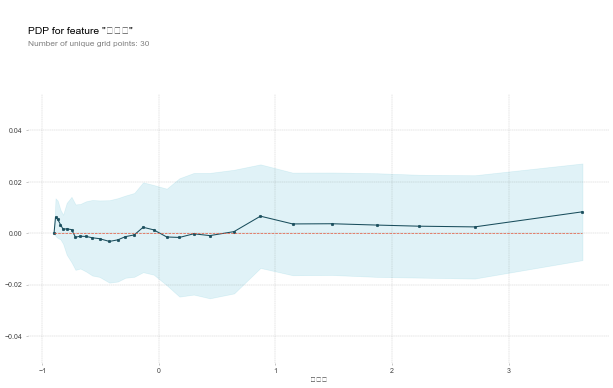

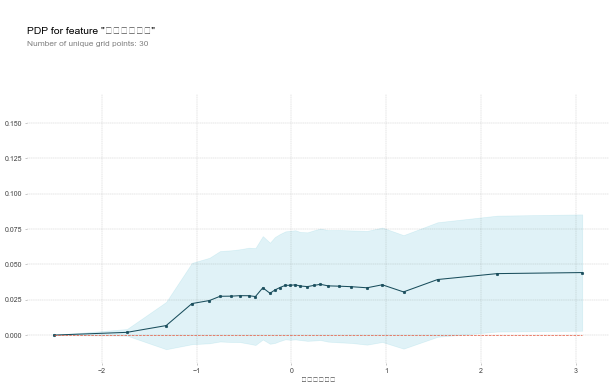

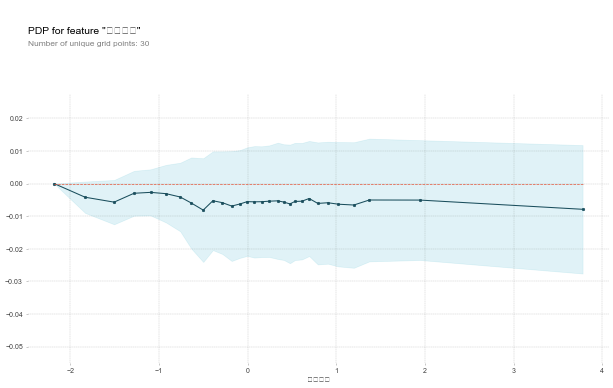

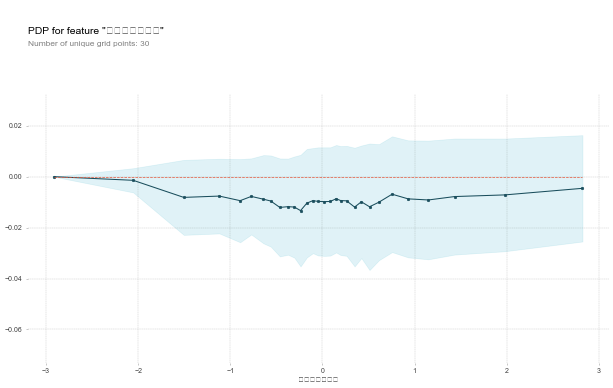

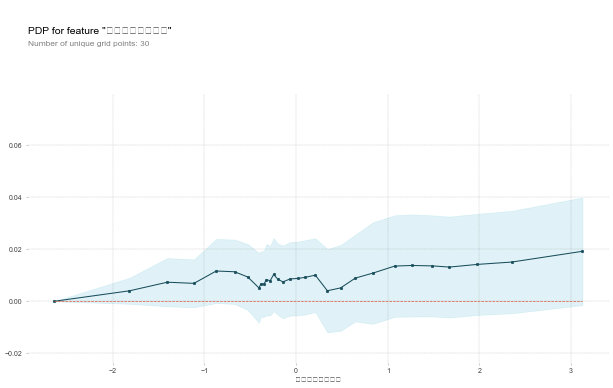

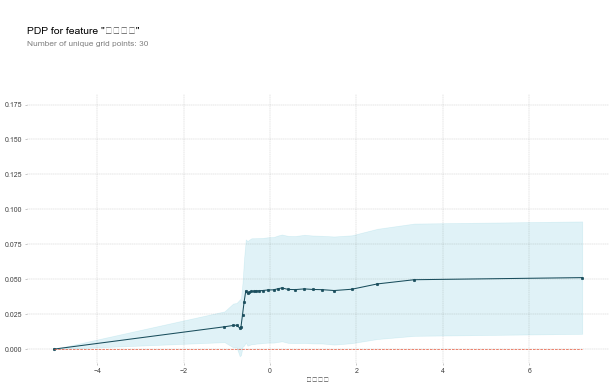

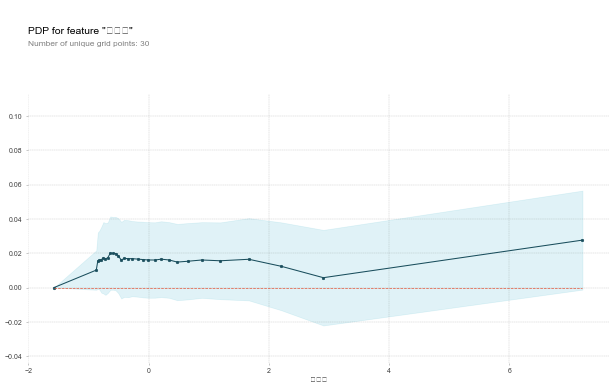

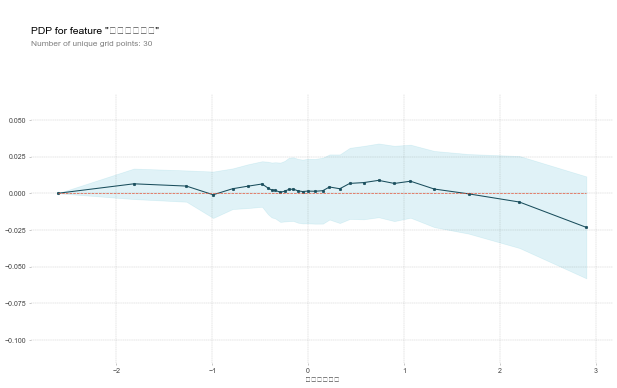

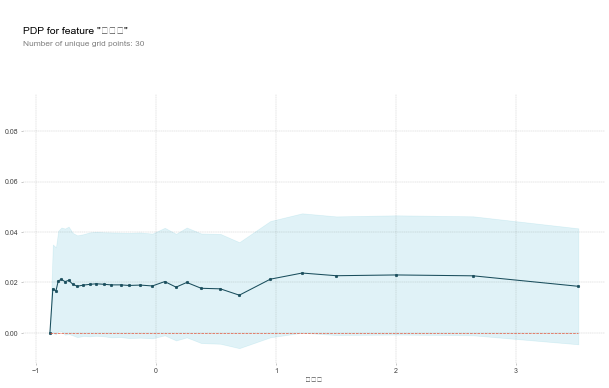

In [366]:
X_test_transfomed = Ensemble_pipeline_2_new.named_steps['preprocessing'].fit_transform(X_test)
X_test_transfomed = pd.DataFrame(X_test_transfomed, columns = X_test.columns)

for i in X_test_selected.columns.tolist():
    pdp(feature= i, model = Ensemble_pipeline_2_new.named_steps['model'], X_test= X_test_transfomed)

In [368]:
X_test_selected.columns

Index(['매출액', '매출액증가율', '부채비율', '영업이익증가율', '자기자본순이익률', '자본총계', '총부채', '총자본증가율',
       '총자산'],
      dtype='object')